In [431]:
import pyspark

In [432]:
from pyspark.sql import SparkSession

In [433]:
Spark = SparkSession.builder.appName('practice').getOrCreate()

In [434]:
Spark

In [435]:
column_names = ['HCHO Reading', 'Location', 'Current Date', 'Next Date']
data_frame = Spark.read.csv('C:/Users/MSI KATANA/Desktop/practice ML/data engineering cw by inupa B/Data-Engineering-HCHO-gas-prediction-/col_mat_nuw_output.csv', header=None, inferSchema=True)
# Assign column names
data_frame = data_frame.toDF(*column_names)

# Show the DataFrame
data_frame.show()


+--------------------+--------------+------------+----------+
|        HCHO Reading|      Location|Current Date| Next Date|
+--------------------+--------------+------------+----------+
|1.969834395781014...|Colombo Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|Colombo Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|Colombo Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|Colombo Proper|  2019-01-04|2019-01-05|
|1.785337298892930...|Colombo Proper|  2019-01-05|2019-01-06|
|1.082296700235670...|Colombo Proper|  2019-01-06|2019-01-07|
|3.926829280477309...|Colombo Proper|  2019-01-07|2019-01-08|
|9.153156350685351E-5|Colombo Proper|  2019-01-08|2019-01-09|
|1.205978992853015...|Colombo Proper|  2019-01-09|2019-01-10|
|1.297723562983258...|Colombo Proper|  2019-01-10|2019-01-11|
|2.239188166801278...|Colombo Proper|  2019-01-11|2019-01-12|
|1.569418094178759...|Colombo Proper|  2019-01-12|2019-01-13|
|                NULL|Colombo Proper|  2019-01-13|2019-01-14|
|1.33629

In [436]:

# number of rows
num_rows = data_frame.count()

# number of columns
num_columns = len(data_frame.columns)

# shape
print("Shape of the DataFrame: {} rows, {} columns".format(num_rows, num_columns))


Shape of the DataFrame: 5478 rows, 4 columns


In [437]:
data_frame.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



In [438]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns = data_frame.columns

# Calculate missing values for each column
missing_counts = data_frame.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns])

# Show missing counts
missing_counts.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|        2419|       0|           0|        0|
+------------+--------+------------+---------+



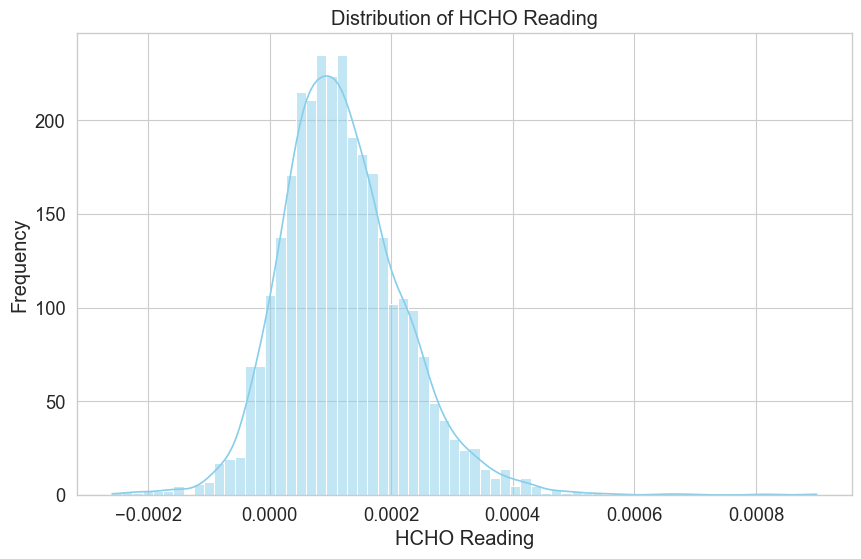

In [439]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the "HCHO Reading" column to a Pandas DataFrame for visualization
hcho_df = data_frame.select("HCHO Reading").toPandas()

# Plot the distribution of the "HCHO Reading" column
plt.figure(figsize=(10, 6))
sns.histplot(hcho_df["HCHO Reading"], kde=True, color='skyblue')
plt.title('Distribution of HCHO Reading')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.show()


In [440]:
from pyspark.sql.window import Window
from pyspark.sql.functions import coalesce, col, lag, lead, count

# Initialize a counter for null values
null_count = data_frame.filter(col("HCHO Reading").isNull()).count()

# Continue the process until there are no nulls left
while null_count > 0:
    # Define the window specifications
    backward_windowSpec = Window.orderBy("Current Date")
    forward_windowSpec = Window.orderBy("Current Date")
    
    # Use lag to carry the last observation forward
    previous_value = lag("HCHO Reading", 1).over(backward_windowSpec)
    data_frame = data_frame.withColumn("HCHO Reading", coalesce("HCHO Reading", previous_value))
    
    # Use lead to carry the next observation backward
    next_value = lead("HCHO Reading", 1).over(forward_windowSpec)
    data_frame = data_frame.withColumn("HCHO Reading", coalesce("HCHO Reading", next_value))
    
    # Update the null count
    null_count = data_frame.filter(col("HCHO Reading").isNull()).count()

# cmn_data now has the nulls filled using a combination of LOCF and NOCB

In [441]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns = data_frame.columns

# Calculate missing values for each column
missing_counts = data_frame.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns])

# Show missing counts
missing_counts.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|           0|       0|           0|        0|
+------------+--------+------------+---------+



In [442]:
data_frame.show()

+--------------------+-------------------+------------+----------+
|        HCHO Reading|           Location|Current Date| Next Date|
+--------------------+-------------------+------------+----------+
|1.969834395781014...|     Colombo Proper|  2019-01-01|2019-01-02|
|1.969834395781014...|   Deniyaya, Matara|  2019-01-01|2019-01-02|
|2.625522171968594...|Nuwara Eliya Proper|  2019-01-01|2019-01-02|
|2.625522171968594...|     Colombo Proper|  2019-01-02|2019-01-03|
|5.803530712000793E-6|   Deniyaya, Matara|  2019-01-02|2019-01-03|
|5.803530712000793E-6|Nuwara Eliya Proper|  2019-01-02|2019-01-03|
|9.852118897938794E-5|     Colombo Proper|  2019-01-03|2019-01-04|
|2.362357772653922...|   Deniyaya, Matara|  2019-01-03|2019-01-04|
|1.908293886956784...|Nuwara Eliya Proper|  2019-01-03|2019-01-04|
|2.099320518114242E-4|     Colombo Proper|  2019-01-04|2019-01-05|
|6.437245753953118E-5|   Deniyaya, Matara|  2019-01-04|2019-01-05|
|5.097625917127737...|Nuwara Eliya Proper|  2019-01-04|2019-01

In [443]:
pandas_df_1 = data_frame.toPandas()
pandas_df_1

,HCHO Reading,Location,Current Date,Next Date
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02
2,0.000263,Nuwara Eliya Proper,2019-01-01,2019-01-02
3,0.000263,Colombo Proper,2019-01-02,2019-01-03
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000116,"Deniyaya, Matara",2023-12-30,2023-12-31
5474,0.000116,Nuwara Eliya Proper,2023-12-30,2023-12-31
5475,0.000080,Colombo Proper,2023-12-31,2024-01-01
5476,0.000080,"Deniyaya, Matara",2023-12-31,2024-01-01


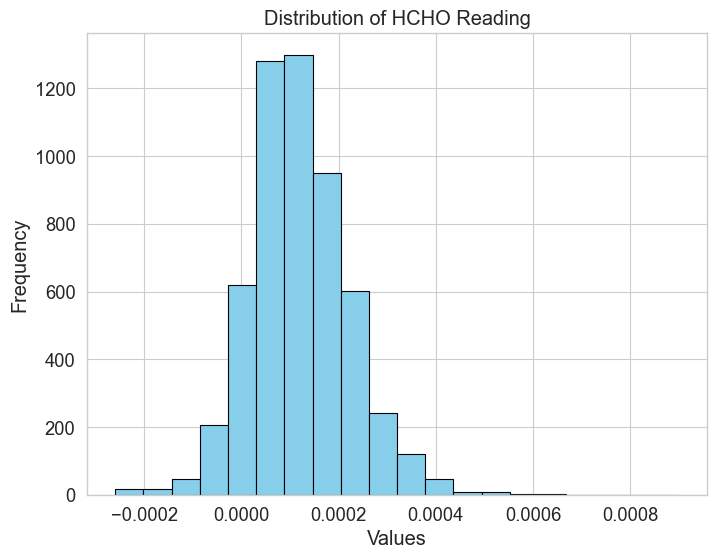

In [444]:
import matplotlib.pyplot as plt

# Selecting the feature "HCHO Reading"
feature = "HCHO Reading"

# Plot histogram for the selected feature
plt.figure(figsize=(8, 6))
plt.hist(pandas_df_1[feature], bins=20, color='skyblue', edgecolor='black')
plt.title(f'Distribution of {feature}')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


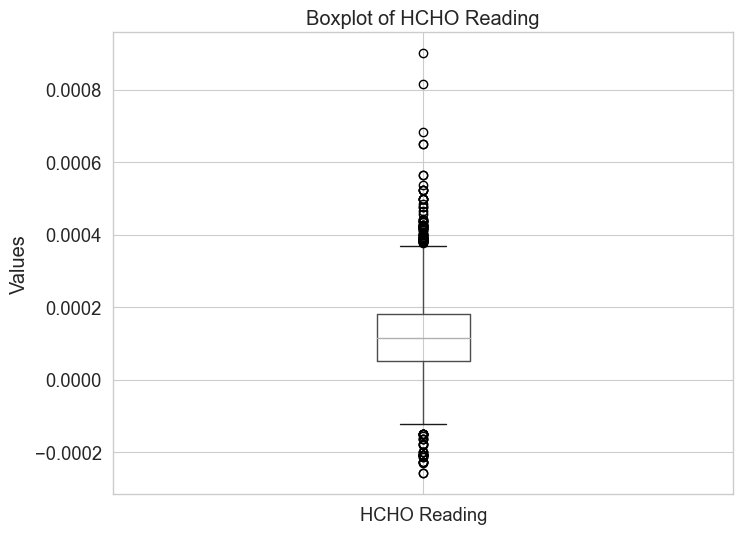

In [445]:
import matplotlib.pyplot as plt

feature = "HCHO Reading"

# Plot boxplot for the selected feature
plt.figure(figsize=(8, 6))
pandas_df_1.boxplot(column=[feature])
plt.title(f'Boxplot of {feature}')
plt.ylabel('Values')
plt.show()


In [446]:
import numpy as np


# Extracting the HCHO readings
hcho_readings = pandas_df_1[feature]

# Calculating quartiles and IQR
Q1 = hcho_readings.quantile(0.25)
Q3 = hcho_readings.quantile(0.75)
IQR = Q3 - Q1

# Defining outlier thresholds
lower_threshold = Q1 - 1.5 * IQR
upper_threshold = Q3 + 1.5 * IQR

# Counting outliers
outliers_frequency = ((hcho_readings < lower_threshold) | (hcho_readings > upper_threshold)).sum()

print("Frequency of outliers:", outliers_frequency)


Frequency of outliers: 112


In [447]:
# Define the Winsorization function
def winsorize(series, lower_threshold, upper_threshold):
    # Winsorize the series
    winsorized_series = series.clip(lower=lower_threshold, upper=upper_threshold)
    return winsorized_series

# Apply Winsorization to handle outliers
pandas_df_1[feature] = winsorize(pandas_df_1[feature], lower_threshold, upper_threshold)

# Recalculate the frequency of outliers after Winsorization
outliers_after_winsorization = ((pandas_df_1[feature] < lower_threshold) | (pandas_df_1[feature] > upper_threshold)).sum()

print("Frequency of outliers after Winsorization:", outliers_after_winsorization)


Frequency of outliers after Winsorization: 0


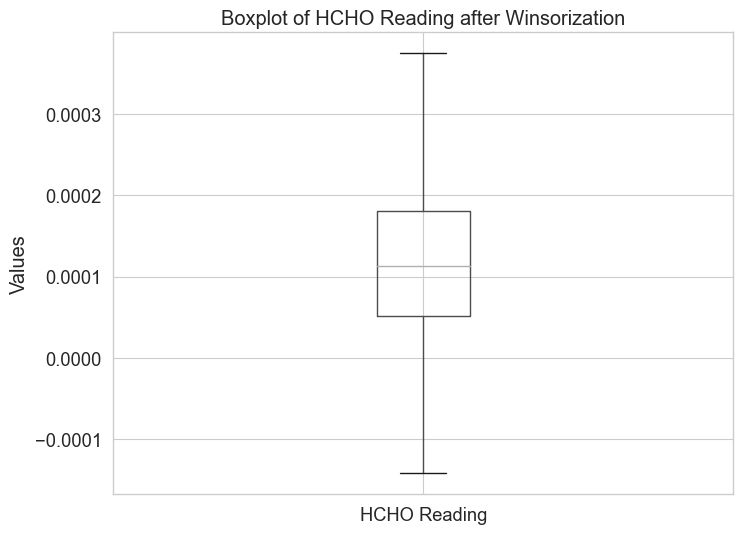

In [448]:
import matplotlib.pyplot as plt

# Plot boxplot for the Winsorized feature
plt.figure(figsize=(8, 6))
pandas_df_1.boxplot(column=[feature])
plt.title(f'Boxplot of {feature} after Winsorization')
plt.ylabel('Values')
plt.show()


In [449]:
pandas_df_1

,HCHO Reading,Location,Current Date,Next Date
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02
2,0.000263,Nuwara Eliya Proper,2019-01-01,2019-01-02
3,0.000263,Colombo Proper,2019-01-02,2019-01-03
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000116,"Deniyaya, Matara",2023-12-30,2023-12-31
5474,0.000116,Nuwara Eliya Proper,2023-12-30,2023-12-31
5475,0.000080,Colombo Proper,2023-12-31,2024-01-01
5476,0.000080,"Deniyaya, Matara",2023-12-31,2024-01-01


In [450]:
for unique_value in sorted(pandas_df_1['HCHO Reading'].unique()):
    print(unique_value)

-0.0001419833925879361
-0.0001226669264724478
-0.00012023889831895004
-0.00011799253267575614
-0.00011215378939636268
-0.0001089299252098114
-0.00010849980753846467
-9.896915283582645e-05
-9.875609976006672e-05
-9.762795257692533e-05
-9.75290000242051e-05
-9.728603617986664e-05
-9.656306209314945e-05
-9.530893663843814e-05
-8.969503664672427e-05
-8.888445964777543e-05
-8.613132454580255e-05
-8.562912389164453e-05
-8.45016286786133e-05
-8.4192331214536e-05
-8.416679327042497e-05
-8.375765006525143e-05
-8.23189832577379e-05
-8.034903995154305e-05
-7.923249506633774e-05
-7.767660943011708e-05
-7.744679386709862e-05
-7.690615160913287e-05
-7.58294658224229e-05
-7.581763929920271e-05
-7.534215509575606e-05
-7.246725134238776e-05
-7.171403386199247e-05
-7.139582778127925e-05
-7.127528630831339e-05
-7.03567768815656e-05
-7.020741959235938e-05
-6.92390668412229e-05
-6.916265567256713e-05
-6.800550885402525e-05
-6.789071314300927e-05
-6.758583905496734e-05
-6.670656110435048e-05
-6.649297855973

In [451]:
for unique_value in sorted(pandas_df_1['Location'].unique()):
    print(unique_value)
    
# need or not to remove this proper part

Colombo Proper
Deniyaya, Matara
Nuwara Eliya Proper


In [452]:
for unique_value in sorted(pandas_df_1['Location'].unique()):
    cleaned_value = unique_value.replace(" Proper", "")  # Replace "Proper" with an empty string
    print(cleaned_value)


Colombo
Deniyaya, Matara
Nuwara Eliya


In [453]:
pandas_df_1['Location'] = pandas_df_1['Location'].replace(" Proper", "", regex=True)


In [454]:
for unique_value in sorted(pandas_df_1['Current Date'].unique()):
    print(unique_value)

2019-01-01
2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01

In [455]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_1['Current Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d') 
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")


Number of dates with improper format: 0


In [456]:
for unique_value in sorted(pandas_df_1['Next Date'].unique()):
    print(unique_value)

2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01
2019-04-02

In [457]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_1['Next Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d')  # Adjust the format according to your date format
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")

Number of dates with improper format: 0


# Final Dataframe 1

In [458]:
pandas_df_1

,HCHO Reading,Location,Current Date,Next Date
0,0.000197,Colombo,2019-01-01,2019-01-02
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02
3,0.000263,Colombo,2019-01-02,2019-01-03
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000116,"Deniyaya, Matara",2023-12-30,2023-12-31
5474,0.000116,Nuwara Eliya,2023-12-30,2023-12-31
5475,0.000080,Colombo,2023-12-31,2024-01-01
5476,0.000080,"Deniyaya, Matara",2023-12-31,2024-01-01


# Importing second dataset Kandy

In [459]:
column_names_2 = ['HCHO Reading', 'Location', 'Current Date', 'Next Date']
data_frame = Spark.read.csv('C:/Users/MSI KATANA/Desktop/practice ML/data engineering cw by inupa B/Data-Engineering-HCHO-gas-prediction-/kan_output.csv', header=None, inferSchema=True)
# Assign column names
data_frame_2 = data_frame.toDF(*column_names_2)

# Show the DataFrame
data_frame_2.show()

+--------------------+------------+------------+----------+
|        HCHO Reading|    Location|Current Date| Next Date|
+--------------------+------------+------------+----------+
|1.760713459877335...|Kandy Proper|  2019-01-01|2019-01-02|
|9.220391253917748E-5|Kandy Proper|  2019-01-02|2019-01-03|
|                NULL|Kandy Proper|  2019-01-03|2019-01-04|
|1.908681983853839...|Kandy Proper|  2019-01-04|2019-01-05|
|1.219517840206744...|Kandy Proper|  2019-01-05|2019-01-06|
|-6.51408612938880...|Kandy Proper|  2019-01-06|2019-01-07|
|  1.6323820639265E-4|Kandy Proper|  2019-01-07|2019-01-08|
|-6.73520553391426...|Kandy Proper|  2019-01-08|2019-01-09|
|1.279693658243135...|Kandy Proper|  2019-01-09|2019-01-10|
|4.546048424126012E-5|Kandy Proper|  2019-01-10|2019-01-11|
|3.600074175192105E-5|Kandy Proper|  2019-01-11|2019-01-12|
|1.286629698010177E-4|Kandy Proper|  2019-01-12|2019-01-13|
|                NULL|Kandy Proper|  2019-01-13|2019-01-14|
|                NULL|Kandy Proper|  201

In [460]:
# Get the number of rows
num_rows = data_frame_2.count()

# Get the number of columns
num_columns = len(data_frame_2.columns)

# Print the shape
print("Shape of the DataFrame: {} rows, {} columns".format(num_rows, num_columns))

Shape of the DataFrame: 1826 rows, 4 columns


In [461]:
data_frame_2.printSchema()

root
 |-- HCHO Reading: double (nullable = true)
 |-- Location: string (nullable = true)
 |-- Current Date: date (nullable = true)
 |-- Next Date: date (nullable = true)



In [462]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns = data_frame_2.columns

# Calculate missing values for each column
missing_counts = data_frame_2.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns])

# Show missing counts
missing_counts.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|         793|       0|           0|        0|
+------------+--------+------------+---------+



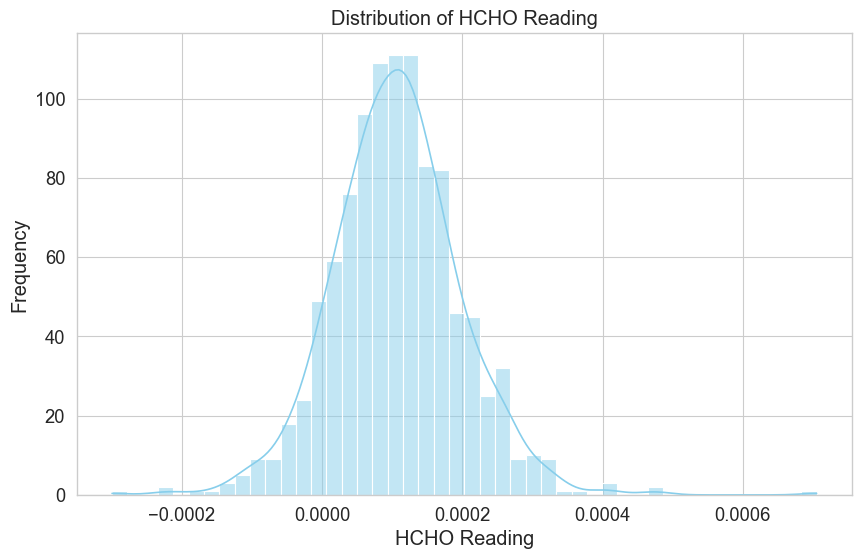

In [463]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the "HCHO Reading" column to a Pandas DataFrame for visualization
hcho_df_2 = data_frame_2.select("HCHO Reading").toPandas()

# Plot the distribution of the "HCHO Reading" column
plt.figure(figsize=(10, 6))
sns.histplot(hcho_df_2 ["HCHO Reading"], kde=True, color='skyblue')
plt.title('Distribution of HCHO Reading')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.show()


In [464]:
from pyspark.sql.window import Window
from pyspark.sql.functions import coalesce, col, lag, lead, count

# Initialize a counter for null values
null_count_2 = data_frame_2.filter(col("HCHO Reading").isNull()).count()

# Continue the process until there are no nulls left
while null_count_2 > 0:
    # Define the window specifications
    backward_windowSpec = Window.orderBy("Current Date")
    forward_windowSpec = Window.orderBy("Current Date")
    
    # Use lag to carry the last observation forward
    previous_value = lag("HCHO Reading", 1).over(backward_windowSpec)
    data_frame_2 = data_frame_2.withColumn("HCHO Reading", coalesce("HCHO Reading", previous_value))
    
    # Use lead to carry the next observation backward
    next_value = lead("HCHO Reading", 1).over(forward_windowSpec)
    data_frame_2 = data_frame_2.withColumn("HCHO Reading", coalesce("HCHO Reading", next_value))
    
    # Update the null count
    null_count_2 = data_frame_2.filter(col("HCHO Reading").isNull()).count()


In [465]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns_2 = data_frame_2.columns

# Calculate missing values for each column
missing_counts_2 = data_frame_2.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns_2])

# Show missing counts
missing_counts_2.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|           0|       0|           0|        0|
+------------+--------+------------+---------+



In [466]:
pandas_df_2 = data_frame_2.toPandas()
pandas_df_2

,HCHO Reading,Location,Current Date,Next Date
0,0.000176,Kandy Proper,2019-01-01,2019-01-02
1,0.000092,Kandy Proper,2019-01-02,2019-01-03
2,0.000092,Kandy Proper,2019-01-03,2019-01-04
3,0.000191,Kandy Proper,2019-01-04,2019-01-05
4,0.000122,Kandy Proper,2019-01-05,2019-01-06
...,...,...,...,...
1821,0.000056,Kandy Proper,2023-12-27,2023-12-28
1822,0.000056,Kandy Proper,2023-12-28,2023-12-29
1823,0.000056,Kandy Proper,2023-12-29,2023-12-30
1824,0.000056,Kandy Proper,2023-12-30,2023-12-31


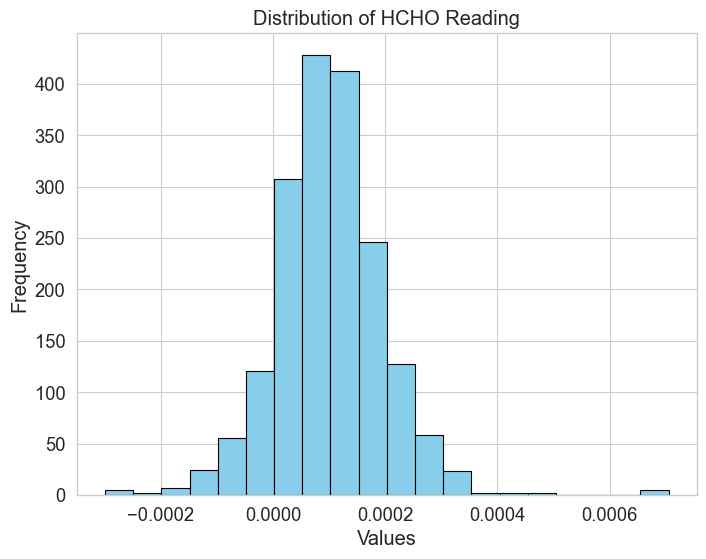

In [467]:
import matplotlib.pyplot as plt

# Selecting the feature "HCHO Reading"
feature_2 = "HCHO Reading"

# Plot histogram for the selected feature
plt.figure(figsize=(8, 6))
plt.hist(pandas_df_2[feature_2], bins=20, color='skyblue', edgecolor='black')
plt.title(f'Distribution of {feature}')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

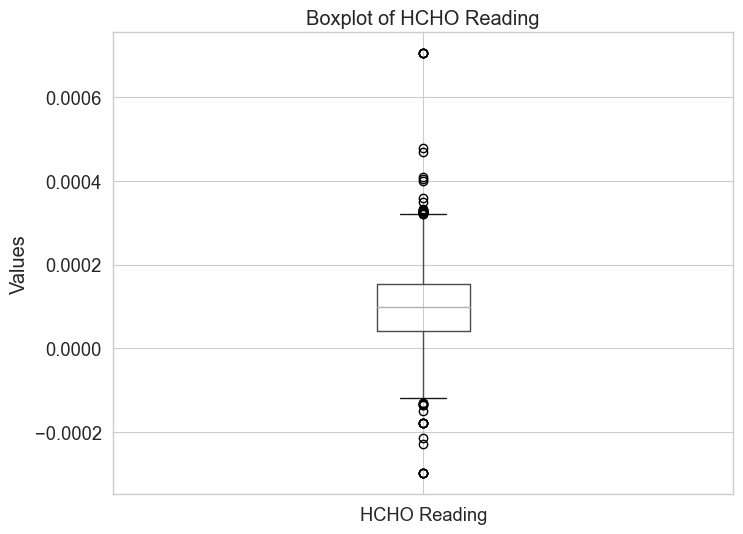

In [468]:
import matplotlib.pyplot as plt

feature_2 = "HCHO Reading"

# Plot boxplot for the selected feature
plt.figure(figsize=(8, 6))
pandas_df_2.boxplot(column=[feature_2])
plt.title(f'Boxplot of {feature}')
plt.ylabel('Values')
plt.show()

In [469]:
hcho_readings_2 = pandas_df_2[feature_2]

# Calculating quartiles and IQR
Q1_2 = hcho_readings_2.quantile(0.25)
Q3_2 = hcho_readings_2.quantile(0.75)
IQR_2 = Q3_2 - Q1_2

# Defining outlier thresholds
lower_threshold_2 = Q1_2 - 1.5 * IQR_2
upper_threshold_2 = Q3_2 + 1.5 * IQR_2

# Counting outliers
outliers_frequency_2 = ((hcho_readings_2 < lower_threshold_2) | (hcho_readings_2 > upper_threshold_2)).sum()

print("Frequency of outliers in feature_2:", outliers_frequency_2)



Frequency of outliers in feature_2: 45


In [470]:
# Define the Winsorization function
def winsorize(series, lower_threshold, upper_threshold):
    # Winsorize the series
    winsorized_series = series.clip(lower=lower_threshold, upper=upper_threshold)
    return winsorized_series

# Apply Winsorization to handle outliers
pandas_df_2[feature_2] = winsorize(pandas_df_2[feature_2], lower_threshold_2, upper_threshold_2)

# Recalculate the frequency of outliers after Winsorization
outliers_after_winsorization_2 = ((pandas_df_2[feature_2] < lower_threshold_2) | (pandas_df_2[feature_2] > upper_threshold_2)).sum()

print("Frequency of outliers after Winsorization in feature_2:", outliers_after_winsorization_2)


Frequency of outliers after Winsorization in feature_2: 0


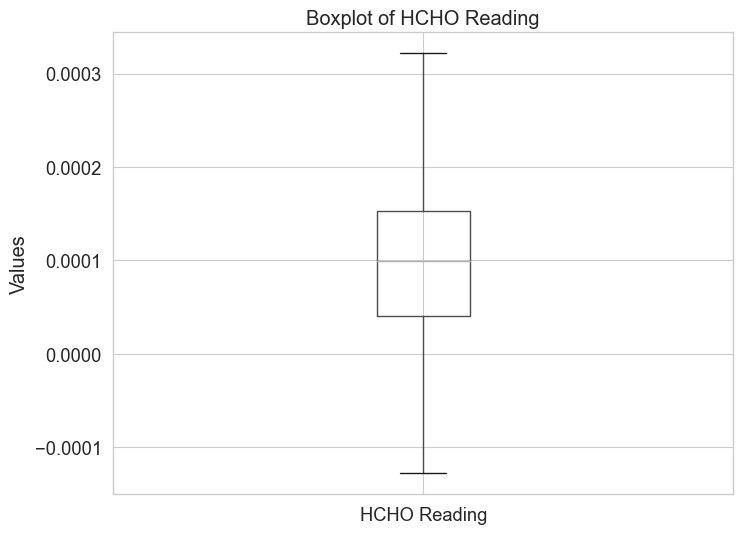

In [471]:
import matplotlib.pyplot as plt

feature_2 = "HCHO Reading"

# Plot boxplot for the selected feature
plt.figure(figsize=(8, 6))
pandas_df_2.boxplot(column=[feature_2])
plt.title(f'Boxplot of {feature}')
plt.ylabel('Values')
plt.show()

In [472]:
pandas_df_2

,HCHO Reading,Location,Current Date,Next Date
0,0.000176,Kandy Proper,2019-01-01,2019-01-02
1,0.000092,Kandy Proper,2019-01-02,2019-01-03
2,0.000092,Kandy Proper,2019-01-03,2019-01-04
3,0.000191,Kandy Proper,2019-01-04,2019-01-05
4,0.000122,Kandy Proper,2019-01-05,2019-01-06
...,...,...,...,...
1821,0.000056,Kandy Proper,2023-12-27,2023-12-28
1822,0.000056,Kandy Proper,2023-12-28,2023-12-29
1823,0.000056,Kandy Proper,2023-12-29,2023-12-30
1824,0.000056,Kandy Proper,2023-12-30,2023-12-31


In [473]:
for unique_value in sorted(pandas_df_2['HCHO Reading'].unique()):
    print(unique_value)

-0.0001281891562261647
-0.00011972465671369591
-0.00011102503012718791
-0.00010953149395993691
-0.00010505652825361387
-0.00010421431136271193
-0.00010153305191015103
-0.00010142346317757635
-9.997653983236062e-05
-9.744629293521989e-05
-9.723458801103359e-05
-9.640269790807805e-05
-9.298285259082747e-05
-9.03955878775148e-05
-8.405673784804399e-05
-8.121993178601313e-05
-7.823375594718562e-05
-7.303543319663562e-05
-7.114043515272996e-05
-6.735205533914268e-05
-6.719856740310691e-05
-6.514086129388805e-05
-6.488176666242177e-05
-6.311605132129754e-05
-5.9145160006379786e-05
-5.8307068595810777e-05
-5.821006164510963e-05
-5.498078483761552e-05
-5.460778700422602e-05
-5.450984014903148e-05
-5.314761711384331e-05
-5.1735860332476076e-05
-4.821809128200573e-05
-4.6999528422020376e-05
-4.5702171118002286e-05
-4.553184436542499e-05
-4.533776899965042e-05
-4.21289315108277e-05
-4.1407437548567194e-05
-4.0288898409749716e-05
-4.018462979616311e-05
-3.8821261724315655e-05
-3.690479764579448e-0

In [474]:
for unique_value in sorted(pandas_df_2['Location'].unique()):
    print(unique_value)

Kandy Proper


In [475]:
pandas_df_2['Location'] = pandas_df_2['Location'].replace(" Proper", "", regex=True)

In [476]:
for unique_value in sorted(pandas_df_2['Current Date'].unique()):
    print(unique_value)

2019-01-01
2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01

In [477]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_2['Current Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d')  # Adjust the format according to your date format
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")


Number of dates with improper format: 0


In [478]:
for unique_value in sorted(pandas_df_2['Next Date'].unique()):
    print(unique_value)

2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01
2019-04-02

In [479]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_2['Next Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d')  # Adjust the format according to your date format
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")

Number of dates with improper format: 0


# Final dataframe 2

In [480]:
pandas_df_2

,HCHO Reading,Location,Current Date,Next Date
0,0.000176,Kandy,2019-01-01,2019-01-02
1,0.000092,Kandy,2019-01-02,2019-01-03
2,0.000092,Kandy,2019-01-03,2019-01-04
3,0.000191,Kandy,2019-01-04,2019-01-05
4,0.000122,Kandy,2019-01-05,2019-01-06
...,...,...,...,...
1821,0.000056,Kandy,2023-12-27,2023-12-28
1822,0.000056,Kandy,2023-12-28,2023-12-29
1823,0.000056,Kandy,2023-12-29,2023-12-30
1824,0.000056,Kandy,2023-12-30,2023-12-31


# Importing third dataset

In [481]:
column_names_3 = ['HCHO Reading', 'Location', 'Current Date', 'Next Date']
data_frame_3 = Spark.read.csv('C:/Users/MSI KATANA/Desktop/practice ML/data engineering cw by inupa B/Data-Engineering-HCHO-gas-prediction-/mon_kur_jaf_output.csv', header=None, inferSchema=True)
# Assign column names
data_frame_3 = data_frame_3.toDF(*column_names_3)

# Show the DataFrame
data_frame_3.show()

+--------------------+------------------+------------+----------+
|        HCHO Reading|          Location|Current Date| Next Date|
+--------------------+------------------+------------+----------+
|                NULL|Bibile, Monaragala|  2019-01-01|2019-01-02|
|1.919914652467399E-5|Bibile, Monaragala|  2019-01-02|2019-01-03|
|2.811447935930283...|Bibile, Monaragala|  2019-01-03|2019-01-04|
|3.747998184385943E-5|Bibile, Monaragala|  2019-01-04|2019-01-05|
|-1.79826087934531...|Bibile, Monaragala|  2019-01-05|2019-01-06|
|1.457836896179902...|Bibile, Monaragala|  2019-01-06|2019-01-07|
|2.828590802546534...|Bibile, Monaragala|  2019-01-07|2019-01-08|
|                NULL|Bibile, Monaragala|  2019-01-08|2019-01-09|
|1.420850167050957...|Bibile, Monaragala|  2019-01-09|2019-01-10|
|                NULL|Bibile, Monaragala|  2019-01-10|2019-01-11|
|2.014587947072581E-5|Bibile, Monaragala|  2019-01-11|2019-01-12|
|1.582787663210183...|Bibile, Monaragala|  2019-01-12|2019-01-13|
|         

In [482]:
# Get the number of rows
num_rows = data_frame_3.count()

# Get the number of columns
num_columns = len(data_frame_3.columns)

# Print the shape
print("Shape of the DataFrame: {} rows, {} columns".format(num_rows, num_columns))

Shape of the DataFrame: 5478 rows, 4 columns


In [483]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns = data_frame_3.columns

# Calculate missing values for each column
missing_counts = data_frame_3.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns])

# Show missing counts
missing_counts.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|        1652|       0|           0|        0|
+------------+--------+------------+---------+



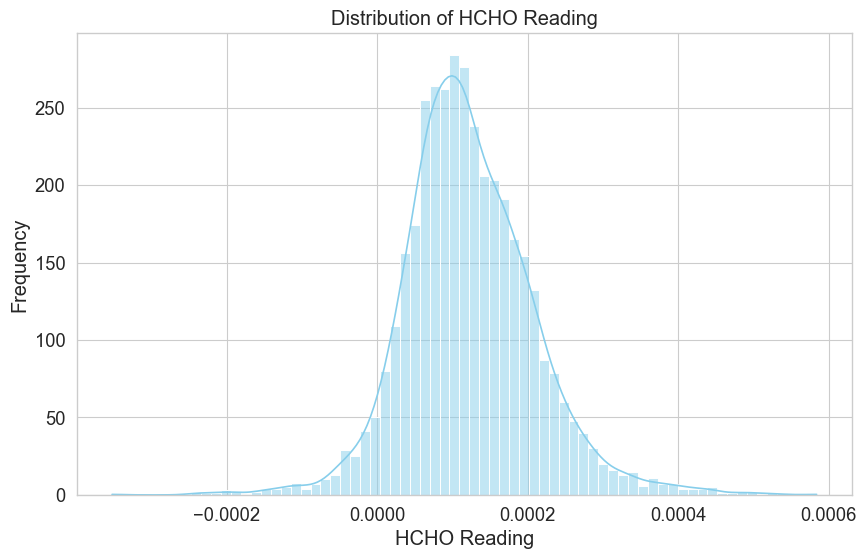

In [484]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the "HCHO Reading" column to a Pandas DataFrame for visualization
hcho_df_3 = data_frame_3.select("HCHO Reading").toPandas()

# Plot the distribution of the "HCHO Reading" column
plt.figure(figsize=(10, 6))
sns.histplot(hcho_df_3["HCHO Reading"], kde=True, color='skyblue')
plt.title('Distribution of HCHO Reading')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.show()

In [485]:
from pyspark.sql.window import Window
from pyspark.sql.functions import coalesce, col, lag, lead, count

# Initialize a counter for null values
null_count_3 = data_frame_3.filter(col("HCHO Reading").isNull()).count()

# Continue the process until there are no nulls left
while null_count_3 > 0:
    # Define the window specifications
    backward_windowSpec = Window.orderBy("Current Date")
    forward_windowSpec = Window.orderBy("Current Date")
    
    # Use lag to carry the last observation forward
    previous_value = lag("HCHO Reading", 1).over(backward_windowSpec)
    data_frame_3 = data_frame_3.withColumn("HCHO Reading", coalesce("HCHO Reading", previous_value))
    
    # Use lead to carry the next observation backward
    next_value = lead("HCHO Reading", 1).over(forward_windowSpec)
    data_frame_3 = data_frame_3.withColumn("HCHO Reading", coalesce("HCHO Reading", next_value))
    
    # Update the null count
    null_count_3 = data_frame_3.filter(col("HCHO Reading").isNull()).count()


In [486]:
from pyspark.sql.functions import col, sum as spark_sum, when

columns_3 = data_frame_3.columns

# Calculate missing values for each column
missing_counts_3 = data_frame_3.select([spark_sum(when(col(c).isNull(), 1).otherwise(0)).alias(c) for c in columns_3])

# Show missing counts
missing_counts_3.show()

+------------+--------+------------+---------+
|HCHO Reading|Location|Current Date|Next Date|
+------------+--------+------------+---------+
|           0|       0|           0|        0|
+------------+--------+------------+---------+



In [487]:
pandas_df_3 = data_frame_3.toPandas()
pandas_df_3

,HCHO Reading,Location,Current Date,Next Date
0,0.000088,"Bibile, Monaragala",2019-01-01,2019-01-02
1,0.000088,Kurunegala Proper,2019-01-01,2019-01-02
2,0.000058,Jaffna Proper,2019-01-01,2019-01-02
3,0.000019,"Bibile, Monaragala",2019-01-02,2019-01-03
4,0.000137,Kurunegala Proper,2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000158,Kurunegala Proper,2023-12-30,2023-12-31
5474,0.000117,Jaffna Proper,2023-12-30,2023-12-31
5475,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01
5476,0.000065,Kurunegala Proper,2023-12-31,2024-01-01


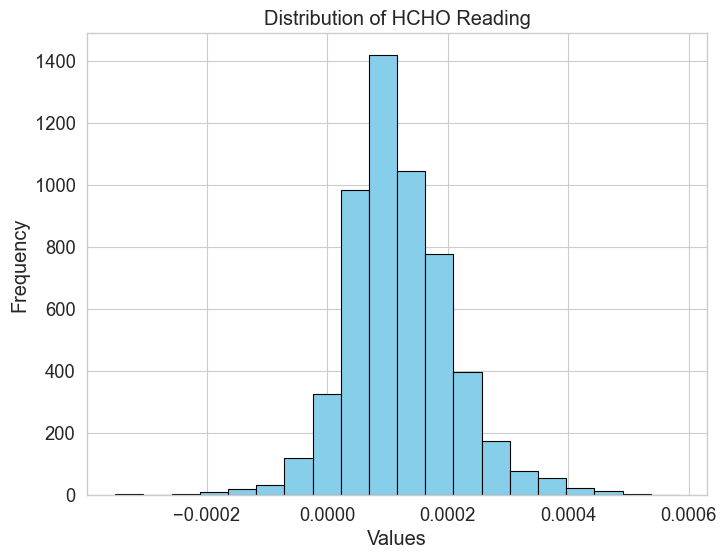

In [488]:
import matplotlib.pyplot as plt

# Selecting the feature "HCHO Reading"
feature_3 = "HCHO Reading"

# Plot histogram for the selected feature
plt.figure(figsize=(8, 6))
plt.hist(pandas_df_3[feature_3], bins=20, color='skyblue', edgecolor='black')
plt.title(f'Distribution of {feature}')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

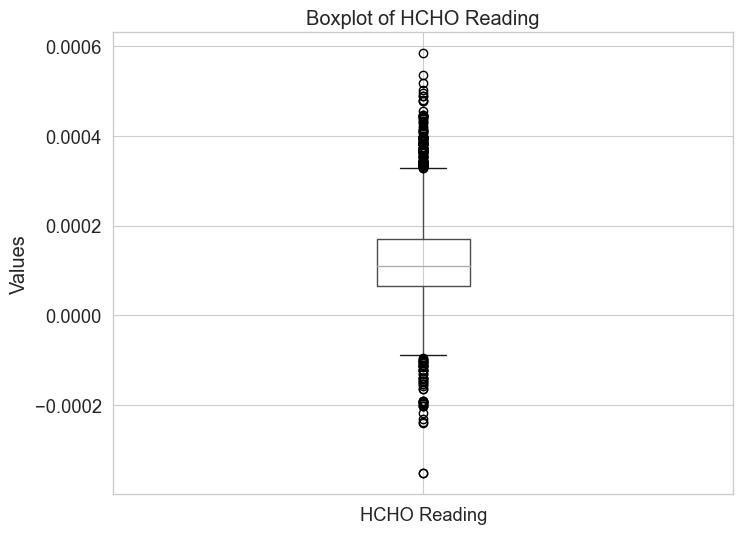

In [489]:
import matplotlib.pyplot as plt

feature_3 = "HCHO Reading"

# Plot boxplot for the selected feature
plt.figure(figsize=(8, 6))
pandas_df_3.boxplot(column=[feature_3])
plt.title(f'Boxplot of {feature}')
plt.ylabel('Values')
plt.show()

In [490]:
# Extracting the HCHO readings from pandas_df_3
hcho_readings_3 = pandas_df_3[feature_3]

# Calculating quartiles and IQR
Q1_3 = hcho_readings_3.quantile(0.25)
Q3_3 = hcho_readings_3.quantile(0.75)
IQR_3 = Q3_3 - Q1_3

# Defining outlier thresholds
lower_threshold_3 = Q1_3 - 1.5 * IQR_3
upper_threshold_3 = Q3_3 + 1.5 * IQR_3

# Counting outliers
outliers_frequency_3 = ((hcho_readings_3 < lower_threshold_3) | (hcho_readings_3 > upper_threshold_3)).sum()

print("Frequency of outliers in feature_3:", outliers_frequency_3)


Frequency of outliers in feature_3: 179


In [491]:
# Define the Winsorization function
def winsorize(series, lower_threshold, upper_threshold):
    # Winsorize the series
    winsorized_series = series.clip(lower=lower_threshold, upper=upper_threshold)
    return winsorized_series

# Apply Winsorization to handle outliers
pandas_df_3[feature_3] = winsorize(pandas_df_3[feature_3], lower_threshold_3, upper_threshold_3)

# Recalculate the frequency of outliers after Winsorization
outliers_after_winsorization_3 = ((pandas_df_3[feature_3] < lower_threshold_3) | (pandas_df_3[feature_3] > upper_threshold_3)).sum()

print("Frequency of outliers after Winsorization in feature_3:", outliers_after_winsorization_3)


Frequency of outliers after Winsorization in feature_3: 0


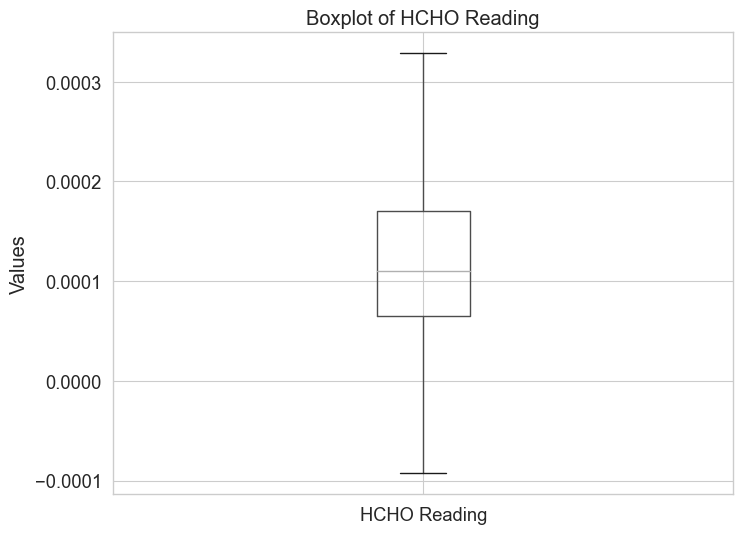

In [492]:
import matplotlib.pyplot as plt

feature_3 = "HCHO Reading"

# Plot boxplot for the selected feature
plt.figure(figsize=(8, 6))
pandas_df_3.boxplot(column=[feature_3])
plt.title(f'Boxplot of {feature}')
plt.ylabel('Values')
plt.show()

In [493]:
pandas_df_3

,HCHO Reading,Location,Current Date,Next Date
0,0.000088,"Bibile, Monaragala",2019-01-01,2019-01-02
1,0.000088,Kurunegala Proper,2019-01-01,2019-01-02
2,0.000058,Jaffna Proper,2019-01-01,2019-01-02
3,0.000019,"Bibile, Monaragala",2019-01-02,2019-01-03
4,0.000137,Kurunegala Proper,2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000158,Kurunegala Proper,2023-12-30,2023-12-31
5474,0.000117,Jaffna Proper,2023-12-30,2023-12-31
5475,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01
5476,0.000065,Kurunegala Proper,2023-12-31,2024-01-01


In [494]:
for unique_value in sorted(pandas_df_3['HCHO Reading'].unique()):
    print(unique_value)

-9.295158630953293e-05
-8.871085539815838e-05
-8.7612250354141e-05
-8.336398007201524e-05
-8.249573147622868e-05
-8.232762056067805e-05
-8.152057093708102e-05
-7.817408913979307e-05
-7.228200424818833e-05
-7.15909409699863e-05
-6.91114370543075e-05
-6.727133903549927e-05
-6.67326523360897e-05
-6.538889368742119e-05
-6.440251342276223e-05
-6.385750734361702e-05
-6.380867365829729e-05
-6.312741217644393e-05
-6.145898821479466e-05
-5.970363291286597e-05
-5.8506497870336726e-05
-5.80993000033222e-05
-5.758271115724228e-05
-5.631724408819705e-05
-5.5806945096190965e-05
-5.382137991659866e-05
-5.2935063658280796e-05
-5.2767861370760775e-05
-5.167498118720221e-05
-5.101817082685539e-05
-5.1007204990354926e-05
-4.907189204896407e-05
-4.886700358960491e-05
-4.8082885768963024e-05
-4.798950304656565e-05
-4.7947211397727374e-05
-4.753552551857047e-05
-4.7006032850858336e-05
-4.671209171647206e-05
-4.658733229933503e-05
-4.614213674005632e-05
-4.5988090400380006e-05
-4.586836205932822e-05
-4.52647

In [495]:
for unique_value in sorted(pandas_df_3['Location'].unique()):
    print(unique_value)

Bibile, Monaragala
Jaffna Proper
Kurunegala Proper


In [496]:
pandas_df_3['Location'] = pandas_df_3['Location'].replace(" Proper", "", regex=True)

In [497]:
for unique_value in sorted(pandas_df_3['Current Date'].unique()):
    print(unique_value)

2019-01-01
2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01

In [498]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_3['Next Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d')  # Adjust the format according to your date format
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")

Number of dates with improper format: 0


In [499]:
for unique_value in sorted(pandas_df_3['Next Date'].unique()):
    print(unique_value)

2019-01-02
2019-01-03
2019-01-04
2019-01-05
2019-01-06
2019-01-07
2019-01-08
2019-01-09
2019-01-10
2019-01-11
2019-01-12
2019-01-13
2019-01-14
2019-01-15
2019-01-16
2019-01-17
2019-01-18
2019-01-19
2019-01-20
2019-01-21
2019-01-22
2019-01-23
2019-01-24
2019-01-25
2019-01-26
2019-01-27
2019-01-28
2019-01-29
2019-01-30
2019-01-31
2019-02-01
2019-02-02
2019-02-03
2019-02-04
2019-02-05
2019-02-06
2019-02-07
2019-02-08
2019-02-09
2019-02-10
2019-02-11
2019-02-12
2019-02-13
2019-02-14
2019-02-15
2019-02-16
2019-02-17
2019-02-18
2019-02-19
2019-02-20
2019-02-21
2019-02-22
2019-02-23
2019-02-24
2019-02-25
2019-02-26
2019-02-27
2019-02-28
2019-03-01
2019-03-02
2019-03-03
2019-03-04
2019-03-05
2019-03-06
2019-03-07
2019-03-08
2019-03-09
2019-03-10
2019-03-11
2019-03-12
2019-03-13
2019-03-14
2019-03-15
2019-03-16
2019-03-17
2019-03-18
2019-03-19
2019-03-20
2019-03-21
2019-03-22
2019-03-23
2019-03-24
2019-03-25
2019-03-26
2019-03-27
2019-03-28
2019-03-29
2019-03-30
2019-03-31
2019-04-01
2019-04-02

In [500]:
import pandas as pd
from datetime import datetime

count_invalid_dates = 0

for unique_date in sorted(pandas_df_3['Next Date'].unique()):
    unique_value = unique_date.strftime('%Y-%m-%d')  # Convert datetime.date to string
    try:
        datetime.strptime(unique_value, '%Y-%m-%d')  # Adjust the format according to your date format
    except ValueError:
        print(f"Invalid date format: {unique_value}")
        count_invalid_dates += 1

print(f"Number of dates with improper format: {count_invalid_dates}")

Number of dates with improper format: 0


# Final dataframe 3

In [501]:
pandas_df_1

,HCHO Reading,Location,Current Date,Next Date
0,0.000197,Colombo,2019-01-01,2019-01-02
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02
3,0.000263,Colombo,2019-01-02,2019-01-03
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000116,"Deniyaya, Matara",2023-12-30,2023-12-31
5474,0.000116,Nuwara Eliya,2023-12-30,2023-12-31
5475,0.000080,Colombo,2023-12-31,2024-01-01
5476,0.000080,"Deniyaya, Matara",2023-12-31,2024-01-01


In [502]:
pandas_df_2

,HCHO Reading,Location,Current Date,Next Date
0,0.000176,Kandy,2019-01-01,2019-01-02
1,0.000092,Kandy,2019-01-02,2019-01-03
2,0.000092,Kandy,2019-01-03,2019-01-04
3,0.000191,Kandy,2019-01-04,2019-01-05
4,0.000122,Kandy,2019-01-05,2019-01-06
...,...,...,...,...
1821,0.000056,Kandy,2023-12-27,2023-12-28
1822,0.000056,Kandy,2023-12-28,2023-12-29
1823,0.000056,Kandy,2023-12-29,2023-12-30
1824,0.000056,Kandy,2023-12-30,2023-12-31


In [503]:
pandas_df_3

,HCHO Reading,Location,Current Date,Next Date
0,0.000088,"Bibile, Monaragala",2019-01-01,2019-01-02
1,0.000088,Kurunegala,2019-01-01,2019-01-02
2,0.000058,Jaffna,2019-01-01,2019-01-02
3,0.000019,"Bibile, Monaragala",2019-01-02,2019-01-03
4,0.000137,Kurunegala,2019-01-02,2019-01-03
...,...,...,...,...
5473,0.000158,Kurunegala,2023-12-30,2023-12-31
5474,0.000117,Jaffna,2023-12-30,2023-12-31
5475,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01
5476,0.000065,Kurunegala,2023-12-31,2024-01-01


In [504]:
import pandas as pd

# Concatenate the datasets row-wise
concatenated_df = pd.concat([pandas_df_1, pandas_df_2, pandas_df_3], axis=0)

# Resetting index 
concatenated_df.reset_index(drop=True, inplace=True)

print(concatenated_df)


       HCHO Reading            Location Current Date   Next Date
0          0.000197             Colombo   2019-01-01  2019-01-02
1          0.000197    Deniyaya, Matara   2019-01-01  2019-01-02
2          0.000263        Nuwara Eliya   2019-01-01  2019-01-02
3          0.000263             Colombo   2019-01-02  2019-01-03
4          0.000006    Deniyaya, Matara   2019-01-02  2019-01-03
...             ...                 ...          ...         ...
12777      0.000158          Kurunegala   2023-12-30  2023-12-31
12778      0.000117              Jaffna   2023-12-30  2023-12-31
12779      0.000117  Bibile, Monaragala   2023-12-31  2024-01-01
12780      0.000065          Kurunegala   2023-12-31  2024-01-01
12781      0.000065              Jaffna   2023-12-31  2024-01-01

[12782 rows x 4 columns]


In [505]:
print(concatenated_df.head())  

   HCHO Reading          Location Current Date   Next Date
0      0.000197           Colombo   2019-01-01  2019-01-02
1      0.000197  Deniyaya, Matara   2019-01-01  2019-01-02
2      0.000263      Nuwara Eliya   2019-01-01  2019-01-02
3      0.000263           Colombo   2019-01-02  2019-01-03
4      0.000006  Deniyaya, Matara   2019-01-02  2019-01-03


In [506]:
# Checking  missing values in the DataFrame
missing_values_in_data_frame = concatenated_df.isnull()

# number of missing values in each column
missing_values_count_in_data_frame = concatenated_df.isnull().sum()

# result
print("Missing Values in Each Column:")
print(missing_values_count_in_data_frame)

Missing Values in Each Column:
HCHO Reading    0
Location        0
Current Date    0
Next Date       0
dtype: int64


In [507]:
# Remove duplicate rows from the DataFrame
concatenated_df.drop_duplicates(inplace=True)

# Display the shape of the DataFrame after removing duplicates
print("Shape after removing duplicates:", concatenated_df.shape)


Shape after removing duplicates: (12782, 4)


In [508]:
print(concatenated_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12782 entries, 0 to 12781
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   HCHO Reading  12782 non-null  float64
 1   Location      12782 non-null  object 
 2   Current Date  12782 non-null  object 
 3   Next Date     12782 non-null  object 
dtypes: float64(1), object(3)
memory usage: 399.6+ KB
None


In [509]:
# Step 3: Summary Statistics
print(concatenated_df.describe())

       HCHO Reading
count  12782.000000
mean       0.000116
std        0.000090
min       -0.000142
25%        0.000057
50%        0.000110
75%        0.000171
max        0.000374


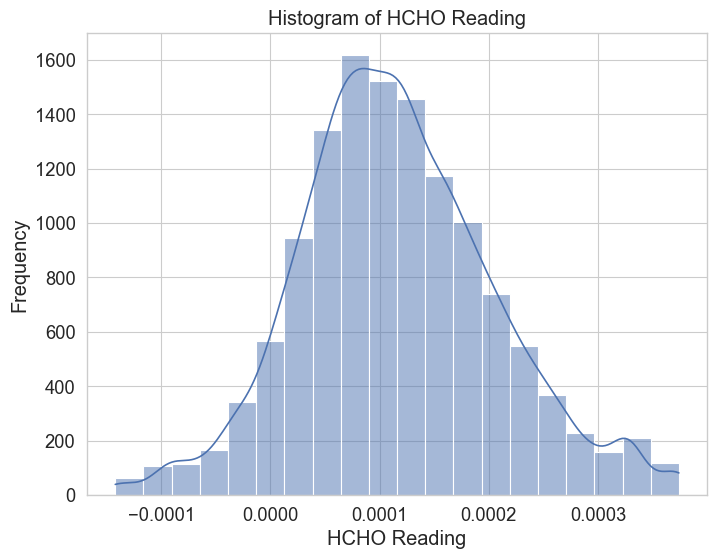

In [510]:
# Histogram of 'HCHO Reading'
plt.figure(figsize=(8, 6))
sns.histplot(data=concatenated_df, x='HCHO Reading', bins=20, kde=True)
plt.title('Histogram of HCHO Reading')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.show()

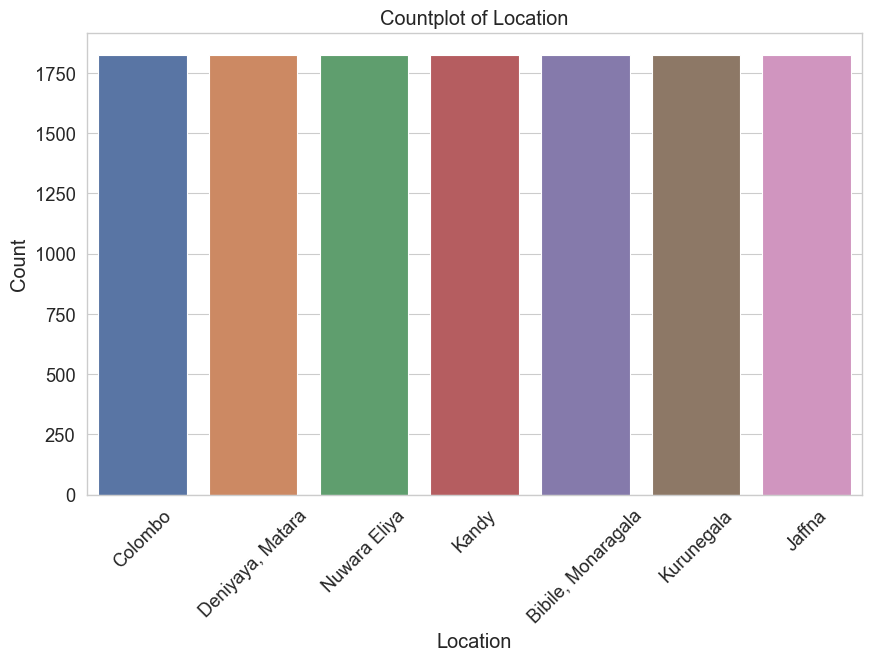

In [511]:
# Countplot of 'Location'
plt.figure(figsize=(10, 6))
sns.countplot(data=concatenated_df, x='Location')
plt.title('Countplot of Location')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [512]:
#concatenated_df.to_csv('concatenated_data.csv', index=False)

In [513]:
concatenated_df['Current Date'] = pd.to_datetime(concatenated_df['Current Date'])
concatenated_df['Next Date'] = pd.to_datetime(concatenated_df['Next Date'])

In [514]:
# Extracting year and month for seasonal analysis
concatenated_df['Year'] = concatenated_df['Current Date'].dt.year
concatenated_df['Month'] = concatenated_df['Current Date'].dt.month

In [515]:
location_stats = concatenated_df.groupby('Location')['HCHO Reading'].describe()
location_stats

,count,mean,std,min,25%,50%,75%,max
Location,,,,,,,,
"Bibile, Monaragala",1826.0,0.000120,0.000086,-0.000093,0.000063,0.000112,0.000177,0.000328
Colombo,1826.0,0.000143,0.000100,-0.000142,0.000073,0.000137,0.000208,0.000374
"Deniyaya, Matara",1826.0,0.000112,0.000095,-0.000142,0.000048,0.000104,0.000169,0.000374
Jaffna,1826.0,0.000110,0.000076,-0.000093,0.000062,0.000102,0.000154,0.000328
Kandy,1826.0,0.000098,0.000088,-0.000128,0.000040,0.000099,0.000153,0.000322
Kurunegala,1826.0,0.000126,0.000085,-0.000093,0.000069,0.000118,0.000181,0.000328
Nuwara Eliya,1826.0,0.000104,0.000094,-0.000142,0.000041,0.000098,0.000161,0.000374


In [516]:
# Grouping data by year and month for seasonal analysis
seasonal_data = concatenated_df.groupby(['Year', 'Month'])['HCHO Reading'].mean().reset_index()

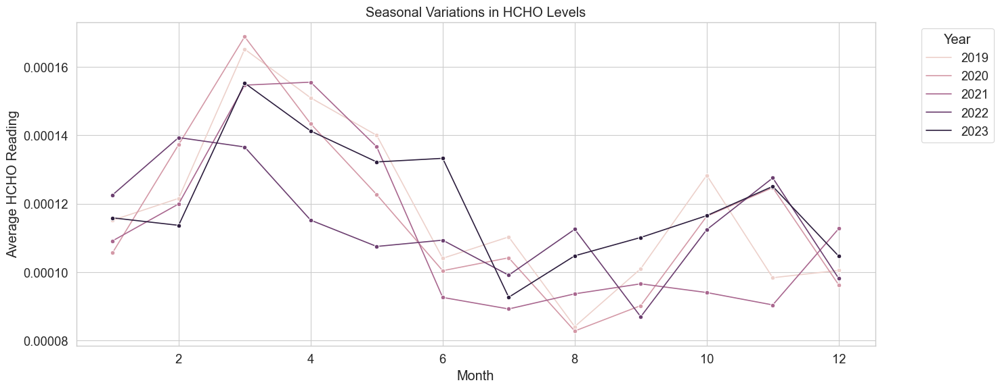

In [517]:
# Plotting seasonal variations
plt.figure(figsize=(15, 6))
sns.lineplot(x="Month", y="HCHO Reading", hue="Year", data=seasonal_data, marker='o')
plt.title('Seasonal Variations in HCHO Levels')
plt.xlabel('Month')
plt.ylabel('Average HCHO Reading')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

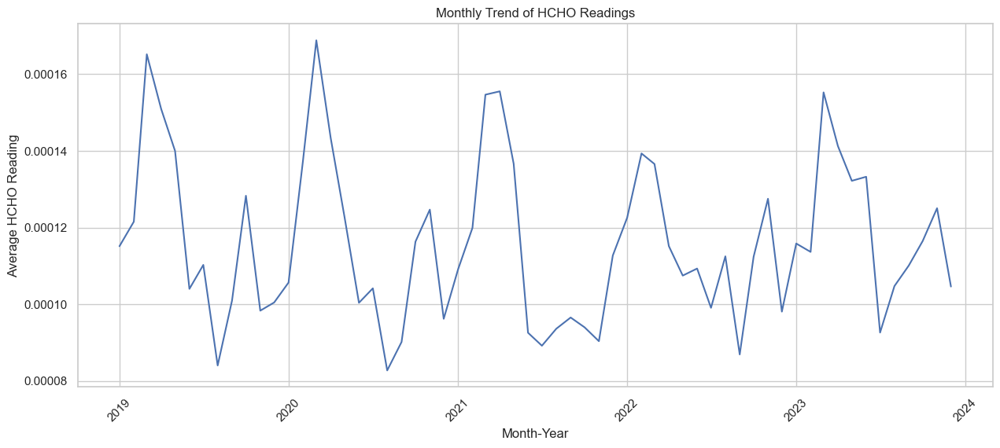

In [518]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Aggregating the HCHO readings on a monthly basis
concatenated_df['Month-Year'] = concatenated_df['Current Date'].dt.to_period('M')
monthly_data = concatenated_df.groupby('Month-Year')['HCHO Reading'].mean().reset_index()

# Converting 'Month-Year' back to datetime for plotting
monthly_data['Month-Year'] = monthly_data['Month-Year'].dt.to_timestamp()

# Plotting the monthly trend of HCHO readings
plt.figure(figsize=(15, 6))
sns.lineplot(x='Month-Year', y='HCHO Reading', data=monthly_data)
plt.title('Monthly Trend of HCHO Readings')
plt.xlabel('Month-Year')
plt.ylabel('Average HCHO Reading')
plt.xticks(rotation=45)
plt.show()


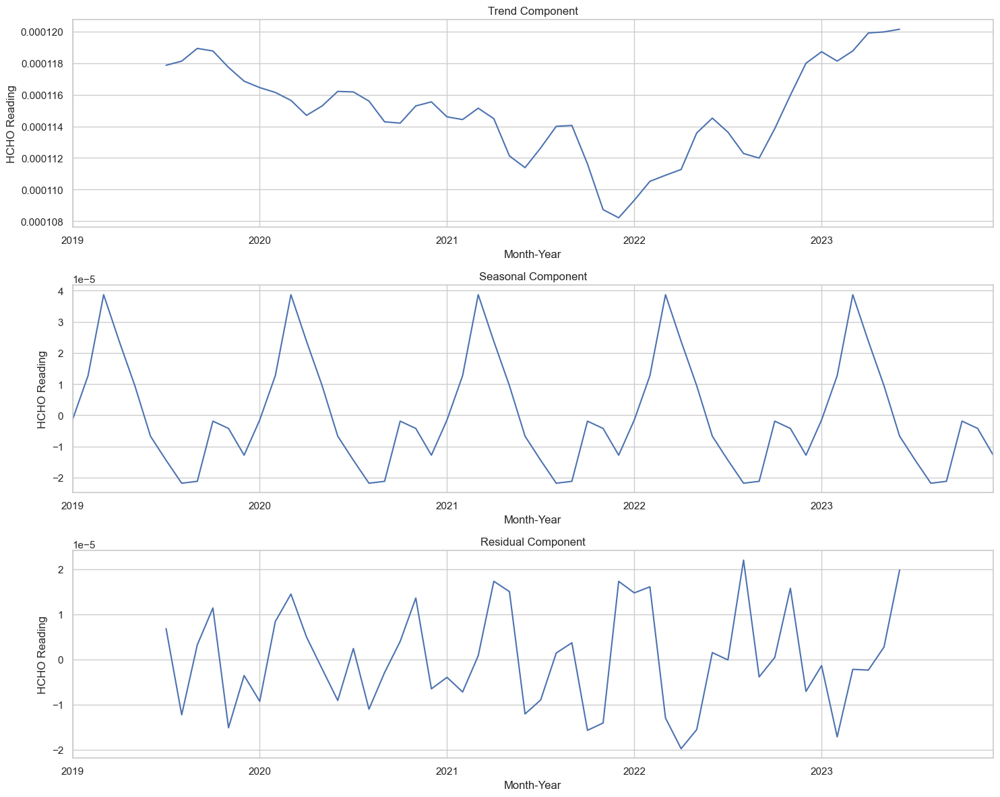

In [519]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Setting the index to 'Month-Year' for time series decomposition
monthly_data.set_index('Month-Year', inplace=True)

# Decomposing the time series
decomposition = seasonal_decompose(monthly_data['HCHO Reading'], model='additive', period=12)

# Plotting the decomposed components
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 12))
decomposition.trend.plot(ax=ax1)
ax1.set_title('Trend Component')
ax1.set_ylabel('HCHO Reading')

decomposition.seasonal.plot(ax=ax2)
ax2.set_title('Seasonal Component')
ax2.set_ylabel('HCHO Reading')

decomposition.resid.plot(ax=ax3)
ax3.set_title('Residual Component')
ax3.set_ylabel('HCHO Reading')

plt.tight_layout()
plt.show()


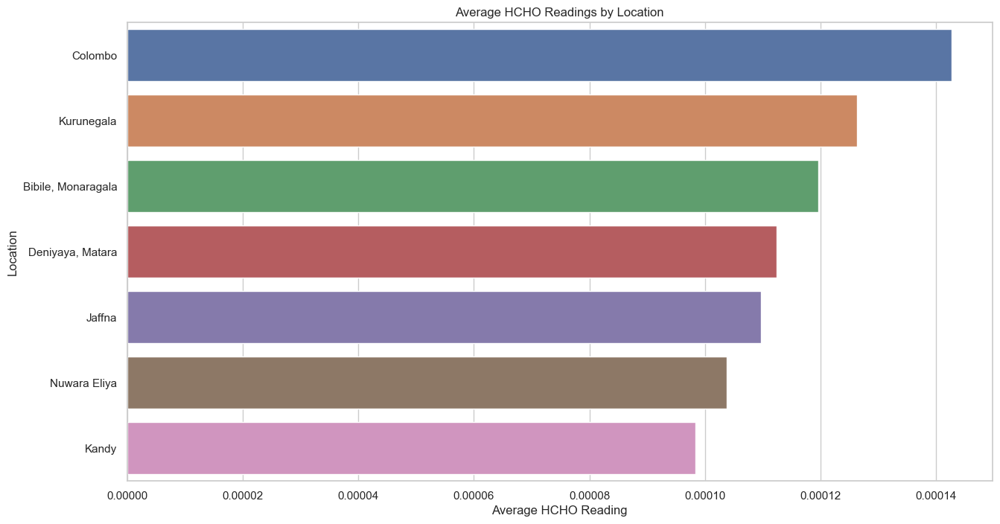

In [520]:
# Grouping the data by location and aggregating HCHO readings
city_data = concatenated_df.groupby('Location')['HCHO Reading'].mean().sort_values(ascending=False).reset_index()

# Plotting the HCHO levels for different cities
plt.figure(figsize=(15, 8))
sns.barplot(x='HCHO Reading', y='Location', data=city_data)
plt.title('Average HCHO Readings by Location')
plt.xlabel('Average HCHO Reading')
plt.ylabel('Location')
plt.show()

In [521]:
# Long-term trend analysis
long_term_trend = concatenated_df.groupby('Year')['HCHO Reading'].mean().reset_index()


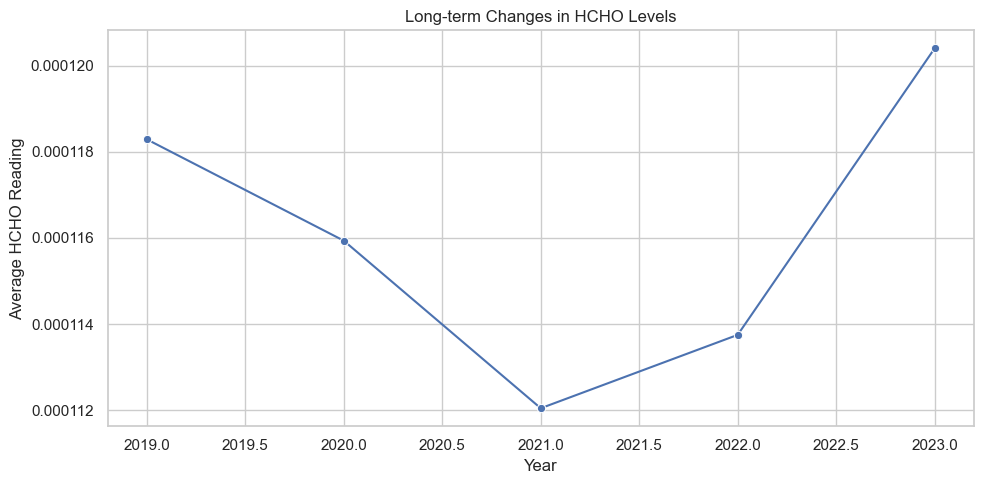

In [522]:
# Plotting long-term changes
plt.figure(figsize=(10, 5))
sns.lineplot(x='Year', y='HCHO Reading', data=long_term_trend, marker='o')
plt.title('Long-term Changes in HCHO Levels')
plt.xlabel('Year')
plt.ylabel('Average HCHO Reading')
plt.grid(True)
plt.tight_layout()
plt.show()

In [523]:
# Filtering data for major cities and 2019-2020 period for COVID-19 lockdown analysis
cities = concatenated_df['Location'].unique()
covid_period_data = concatenated_df[(concatenated_df['Year'] >= 2019) & (concatenated_df['Year'] <= 2020)]

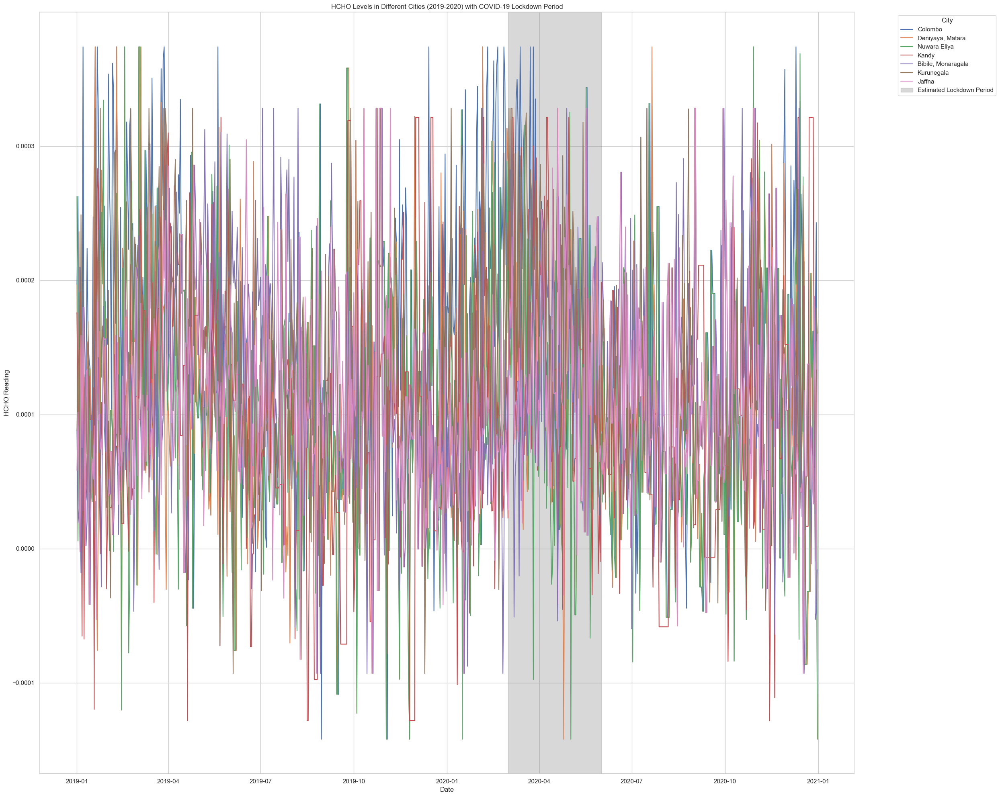

In [524]:
# Plotting HCHO levels for different cities during 2019-2020
plt.figure(figsize=(25, 20))
for city in cities:
    city_data = covid_period_data[covid_period_data['Location'] == city]
    sns.lineplot(x='Current Date', y='HCHO Reading', data=city_data, label=city)
    
    
plt.axvspan('2020-03-01', '2020-06-01', color='grey', alpha=0.3, label='Estimated Lockdown Period')
plt.title('HCHO Levels in Different Cities (2019-2020) with COVID-19 Lockdown Period')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

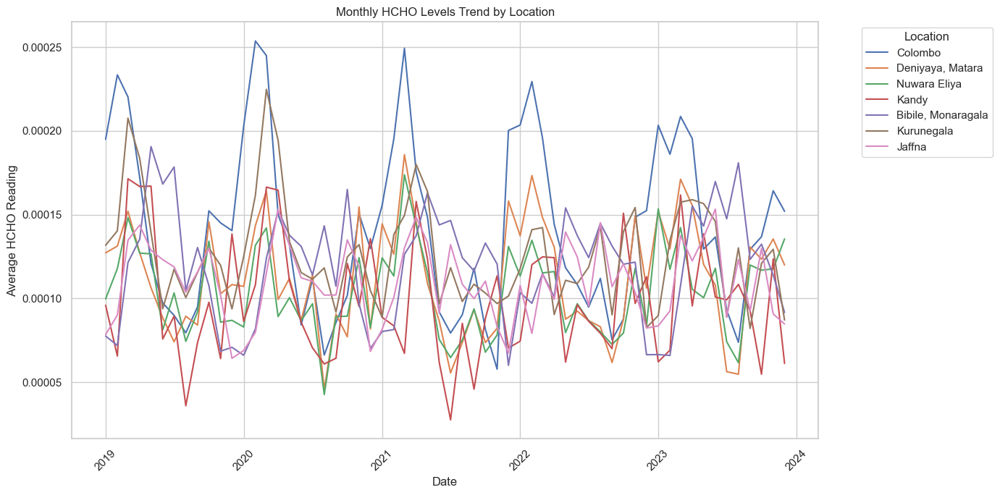

In [525]:
# Plotting using Year and Month for simplification
plt.figure(figsize=(14, 7))
for location in concatenated_df['Location'].unique():
    subset = concatenated_df[concatenated_df['Location'] == location]
    subset = subset.groupby(['Year', 'Month']).agg({'HCHO Reading':'mean'}).reset_index()
    subset['Date'] = pd.to_datetime(subset[['Year', 'Month']].assign(DAY=1))
    sns.lineplot(x='Date', y='HCHO Reading', data=subset, label=location)

plt.xticks(rotation=45)
plt.title('Monthly HCHO Levels Trend by Location')
plt.ylabel('Average HCHO Reading')
plt.xlabel('Date')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()

In [526]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Get unique locations
unique_locations = concatenated_df['Location'].unique()


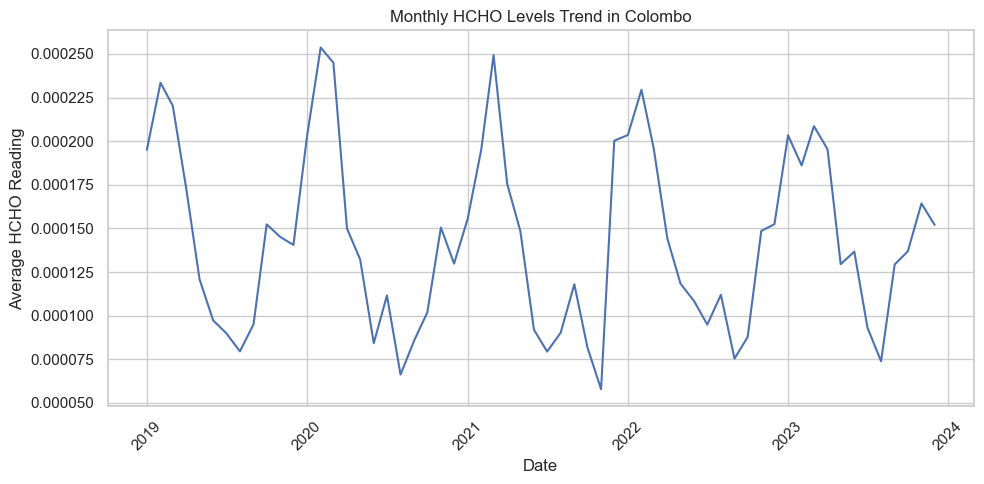

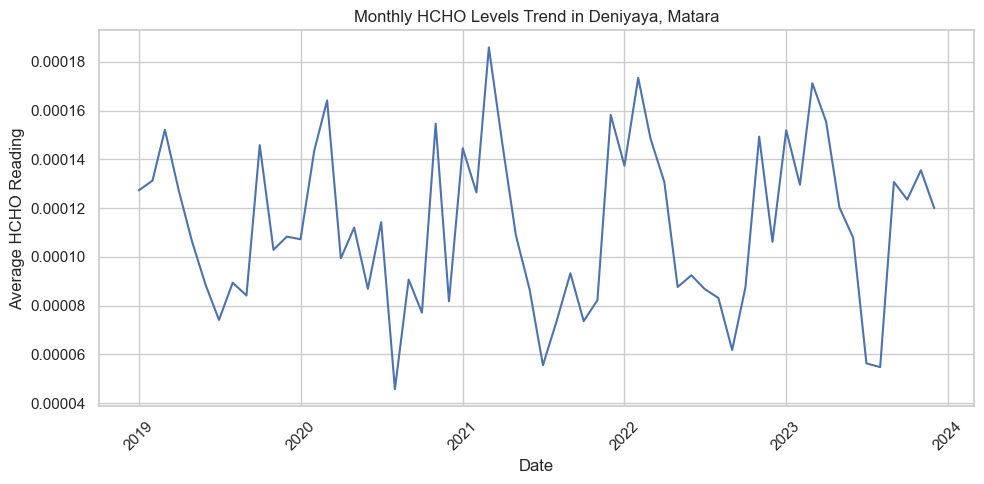

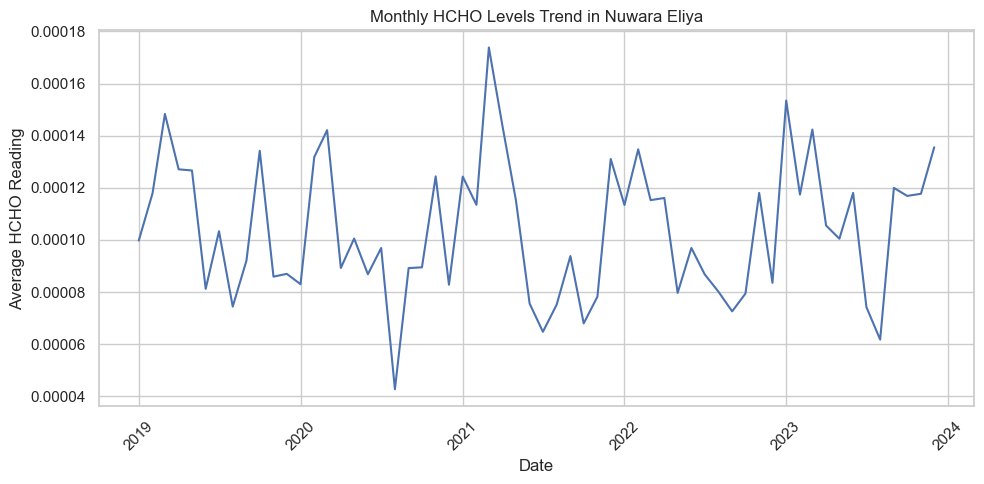

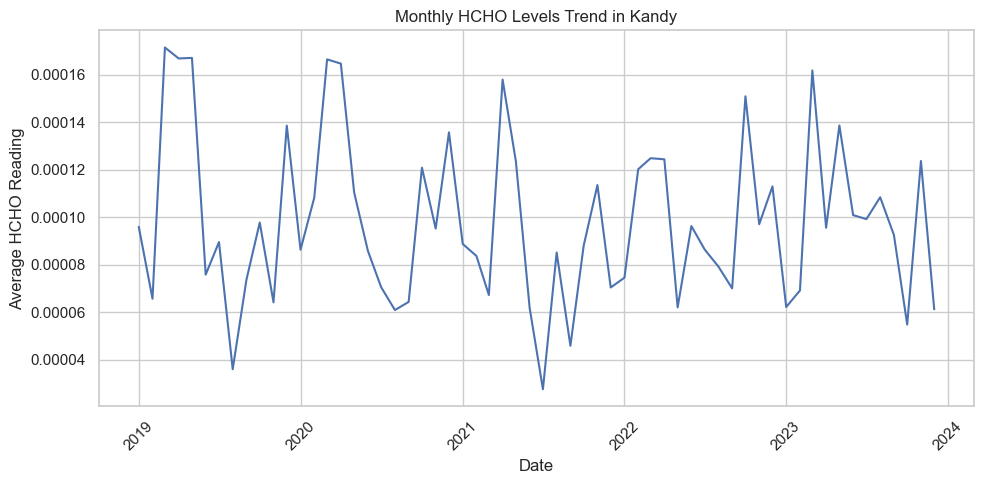

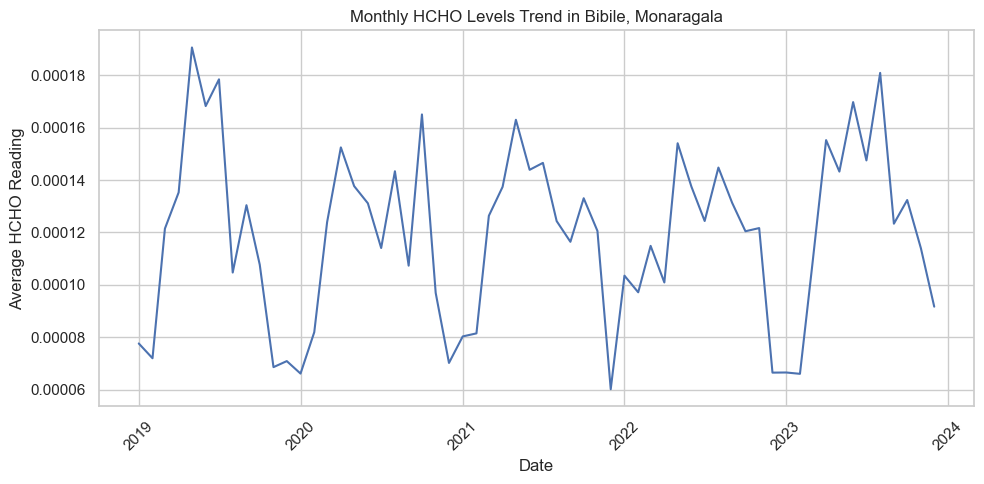

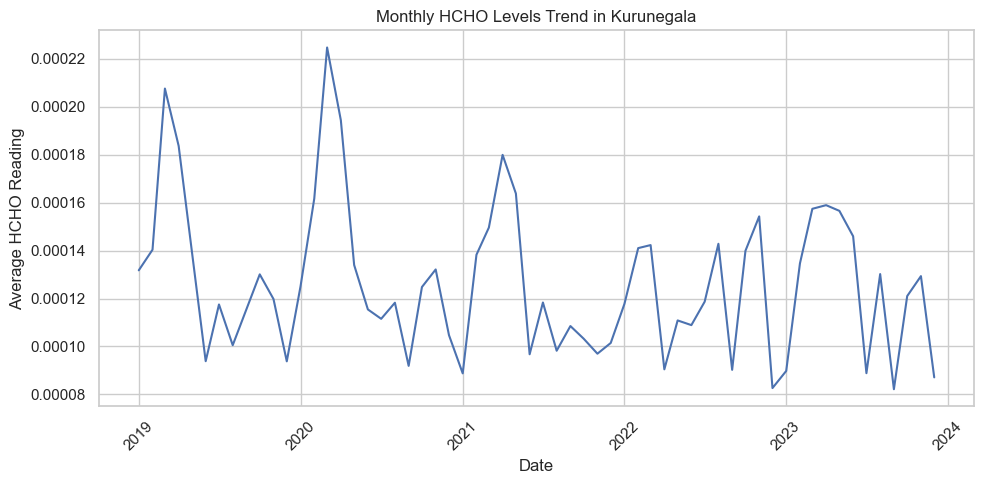

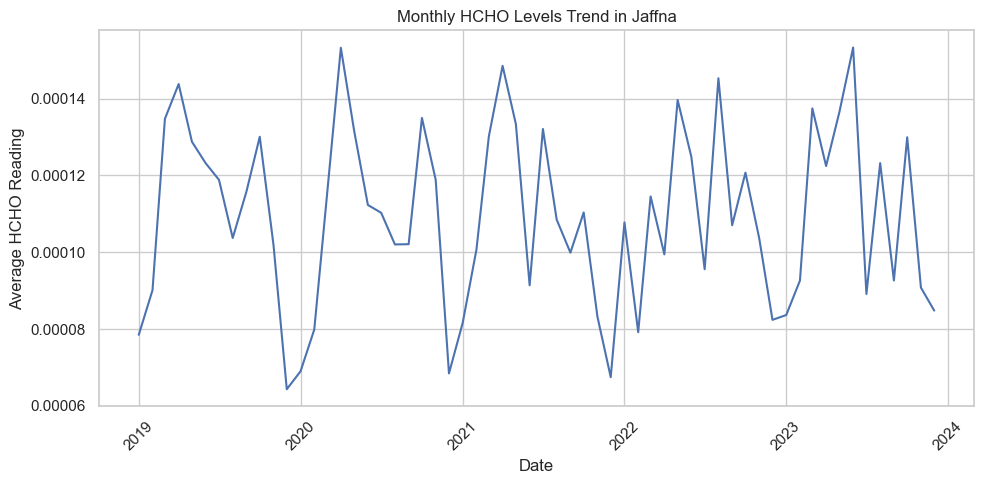

In [527]:
# Iterate through each location and plot separately
for location in unique_locations:
    plt.figure(figsize=(10, 5))  # Adjust figsize as needed
    subset = concatenated_df[concatenated_df['Location'] == location]
    subset = subset.groupby(['Year', 'Month']).agg({'HCHO Reading': 'mean'}).reset_index()
    subset['Date'] = pd.to_datetime(subset[['Year', 'Month']].assign(DAY=1))
    sns.lineplot(x='Date', y='HCHO Reading', data=subset)
    
    plt.xticks(rotation=45)
    plt.title(f'Monthly HCHO Levels Trend in {location}')
    plt.ylabel('Average HCHO Reading')
    plt.xlabel('Date')
    plt.tight_layout()
    plt.show()


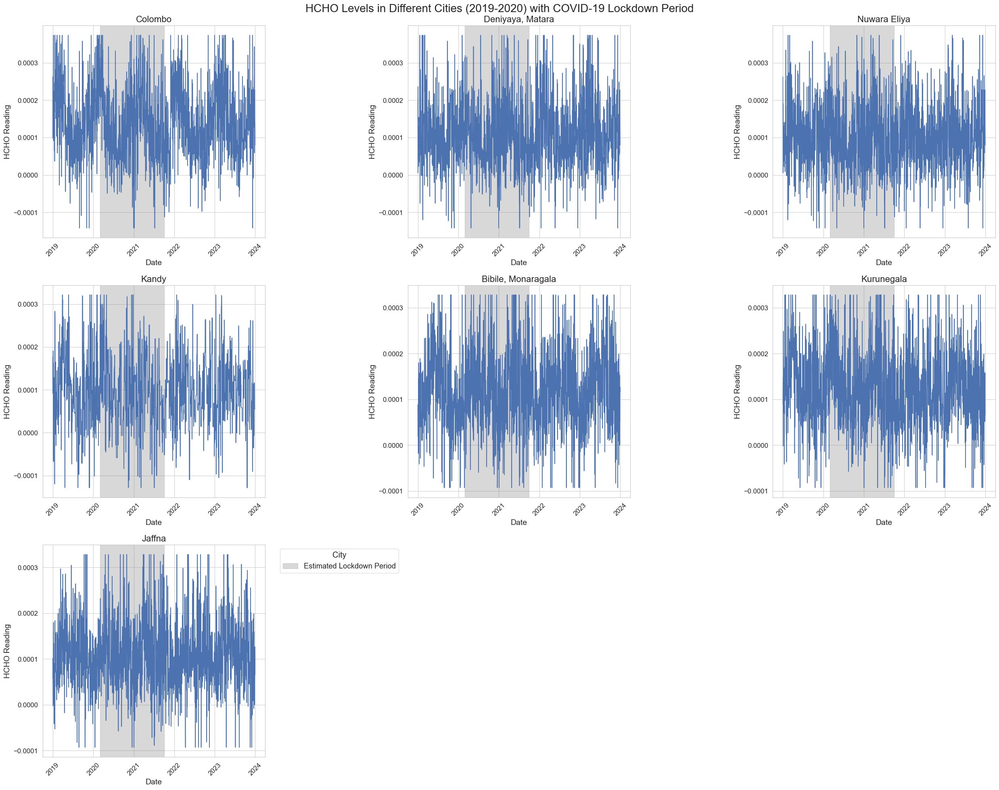

In [528]:
import matplotlib.pyplot as plt
import seaborn as sns

# Increase font sizes for better readability
sns.set_context("paper", font_scale=1.5)

plt.figure(figsize=(25, 20))  # Increase figure size

cities = concatenated_df['Location'].unique()

for i, city in enumerate(cities, start=1):
    plt.subplot(3, 3, i)
    city_data = concatenated_df[concatenated_df['Location'] == city]
    sns.lineplot(x='Current Date', y='HCHO Reading', data=city_data)
    plt.title(city, fontsize=16)  # Increase title font size
    plt.xlabel('Date', fontsize=14)  # Increase x-axis label font size
    plt.ylabel('HCHO Reading', fontsize=14)  # Increase y-axis label font size
    plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis tick labels and increase font size
    plt.yticks(fontsize=12)  # Increase y-axis tick label font size
    
    # Apply shaded region for lockdown period
    plt.axvspan('2020-03-01', '2021-10-01', color='grey', alpha=0.3, label='Estimated Lockdown Period')
    
    # Hide legend for all but the first subplot
    if i != 1:
        plt.legend().set_visible(False)

plt.legend(title='City', bbox_to_anchor=(1.05, 1), loc='upper left')  # Show legend for the last subplot
plt.suptitle('HCHO Levels in Different Cities (2019-2020) with COVID-19 Lockdown Period', fontsize=20)
plt.grid(True)
plt.tight_layout()
plt.show()

In [529]:
concatenated_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02,2019,1,2019-01
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02,2019,1,2019-01
3,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03,2019,1,2019-01
...,...,...,...,...,...,...,...
12777,0.000158,Kurunegala,2023-12-30,2023-12-31,2023,12,2023-12
12778,0.000117,Jaffna,2023-12-30,2023-12-31,2023,12,2023-12
12779,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01,2023,12,2023-12
12780,0.000065,Kurunegala,2023-12-31,2024-01-01,2023,12,2023-12


In [530]:
# Define the periods for comparison
before_lockdown = concatenated_df[concatenated_df['Current Date'] < '2020-03-01']
during_lockdown = concatenated_df[(concatenated_df['Current Date'] >= '2020-03-01') & (concatenated_df['Current Date'] <= '2021-10-01')]
after_lockdown = concatenated_df[concatenated_df['Current Date'] > '2021-10-01']

# Calculate the average HCHO readings for each period
avg_before_lockdown = before_lockdown.groupby('Location')['HCHO Reading'].mean().reset_index(name='Before Lockdown')
avg_during_lockdown = during_lockdown.groupby('Location')['HCHO Reading'].mean().reset_index(name='During Lockdown')
avg_after_lockdown = after_lockdown.groupby('Location')['HCHO Reading'].mean().reset_index(name='After Lockdown')

# Merge the averages for comparison
lockdown_comparison = pd.merge(avg_before_lockdown, avg_during_lockdown, on='Location', how='outer')
lockdown_comparison = pd.merge(lockdown_comparison, avg_after_lockdown, on='Location', how='outer')

# Display the comparison
lockdown_comparison.head()


,Location,Before Lockdown,During Lockdown,After Lockdown
0,"Bibile, Monaragala",0.000113,0.000125,0.000120
1,Colombo,0.000156,0.000135,0.000141
2,"Deniyaya, Matara",0.000113,0.000108,0.000115
3,Jaffna,0.000106,0.000115,0.000108
4,Kandy,0.000103,0.000096,0.000098


In [531]:
# Display the comparison
#lockdown_comparison.to_csv('lockdown_comparison.csv', index=False)

In [532]:
# (safe level to prevent irritation for most people): 0.00008 mol/m²
# (caution level where discomfort and irritation can begin): 0.0001 mol/m²
# (high concern level indicating significant risk of respiratory issues): 0.0003 mol/m²
# (dangerous level, potentially lethal or causing severe health effects): 0.01 mol/m²

# given by chatgpt

In [533]:
data = lockdown_comparison

In [534]:
unique_locations = data['Location'].unique()
unique_locations

array(['Bibile, Monaragala', 'Colombo', 'Deniyaya, Matara', 'Jaffna',
       'Kandy', 'Kurunegala', 'Nuwara Eliya'], dtype=object)

In [535]:
import pandas as pd
import folium

# Define color based on HCHO levels
def color_based_on_level(value):
    if value < 0.00008:
        return 'blue'  # Safe level
    elif value < 0.0001:
        return 'green'  # Caution level
    elif value < 0.0003:
        return 'orange'  # High concern level
    else:
        return 'red'  # Dangerous level

# Function to create a heatmap
def create_heatmap(data, column, title):
    # Start the map centered around Sri Lanka
    map_folium = folium.Map(location=[7.8731, 80.7718], zoom_start=8)
    
    # Add heatpoints with color coding based on HCHO levels
    for idx, row in data.iterrows():
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=50,
            popup=f"{row['Location']}: {row[column]:.6f} mol/m²",
            color=color_based_on_level(row[column]),
            fill=True,
            fill_color=color_based_on_level(row[column])
        ).add_to(map_folium)
    
    # Add title
    title_html = f'''
                 <h3 align="center" style="font-size:20px"><b>{title}</b></h3>
                 '''
    map_folium.get_root().html.add_child(folium.Element(title_html))
    
    return map_folium

# Define coordinates for each city
coordinates = {
    'Bibile, Monaragala': [7.2, 81.2],
    'Colombo': [6.9271, 79.8612],
    'Deniyaya, Matara': [6.34, 80.56],
    'Jaffna': [9.6615, 80.0255],
    'Kandy': [7.2906, 80.6337],
    'Kurunegala': [7.4863, 80.3622],
    'Nuwara Eliya': [6.9708, 80.7829]
}

# Load the dataset
data = lockdown_comparison  # Update this path

# Update the data with latitude and longitude
data['Latitude'] = data['Location'].map(lambda x: coordinates[x][0])
data['Longitude'] = data['Location'].map(lambda x: coordinates[x][1])

# Generate heatmaps for each lockdown phase
map_before_lockdown = create_heatmap(data, 'Before Lockdown', 'HCHO Distribution Before Lockdown')
map_during_lockdown = create_heatmap(data, 'During Lockdown', 'HCHO Distribution During Lockdown')
map_after_lockdown = create_heatmap(data, 'After Lockdown', 'HCHO Distribution After Lockdown')

# Display the heatmaps for each lockdown phase
map_before_lockdown


In [536]:
map_during_lockdown

In [537]:
map_after_lockdown

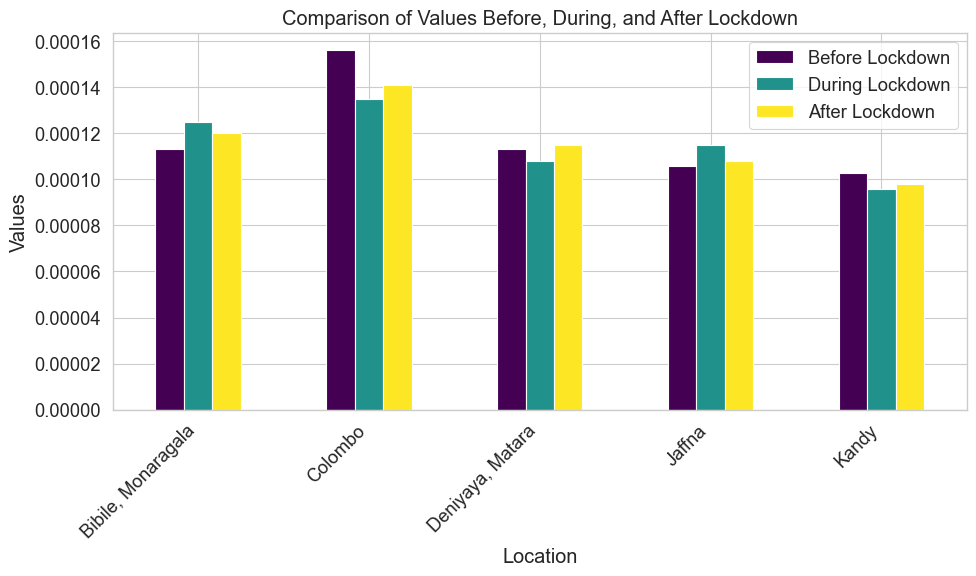

In [538]:
import pandas as pd
import matplotlib.pyplot as plt

# Create the DataFrame from the provided dataset
data = {
    'Location': ['Bibile, Monaragala', 'Colombo', 'Deniyaya, Matara', 'Jaffna', 'Kandy'],
    'Before Lockdown': [0.000113, 0.000156, 0.000113, 0.000106, 0.000103],
    'During Lockdown': [0.000125, 0.000135, 0.000108, 0.000115, 0.000096],
    'After Lockdown': [0.000120, 0.000141, 0.000115, 0.000108, 0.000098]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Set the 'Location' column as the index
df.set_index('Location', inplace=True)

# Plotting
ax = df.plot(kind='bar', figsize=(10, 6), colormap='viridis')

# Customize the plot
ax.set_ylabel('Values')
ax.set_xlabel('Location')
ax.set_title('Comparison of Values Before, During, and After Lockdown')

# Show the plot
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [539]:
hcho_df = concatenated_df
hcho_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02,2019,1,2019-01
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02,2019,1,2019-01
3,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03,2019,1,2019-01
...,...,...,...,...,...,...,...
12777,0.000158,Kurunegala,2023-12-30,2023-12-31,2023,12,2023-12
12778,0.000117,Jaffna,2023-12-30,2023-12-31,2023,12,2023-12
12779,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01,2023,12,2023-12
12780,0.000065,Kurunegala,2023-12-31,2024-01-01,2023,12,2023-12


In [540]:
weather_df = pd.read_csv('C:/Users/MSI KATANA/Desktop/practice ML/data engineering cw by inupa B/Data-Engineering-HCHO-gas-prediction-/SL_weather_data.csv')
weather_df

,time,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,city,precipitation_hours,shortwave_radiation_sum,rain_sum
0,2019-01-01,26.1,28.7,14.4,4.58,16.0,Colombo,0.0,19.77,0.0
1,2019-01-02,25.7,27.3,16.6,5.19,16.0,Colombo,0.0,21.45,0.0
2,2019-01-03,26.1,27.8,16.0,5.21,16.0,Colombo,0.0,21.68,0.0
3,2019-01-04,26.0,27.6,16.9,5.22,16.0,Colombo,0.0,22.95,0.0
4,2019-01-05,26.4,28.9,16.8,5.01,16.0,Colombo,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...
8140,2023-06-13,26.1,29.7,18.9,3.81,124.0,Kurunegala,14.0,18.30,7.0
8141,2023-06-14,26.7,30.2,19.9,4.09,124.0,Kurunegala,8.0,18.93,2.0
8142,2023-06-15,27.1,30.7,17.2,4.15,124.0,Kurunegala,9.0,18.24,1.9
8143,2023-06-16,27.1,30.7,21.3,4.35,124.0,Kurunegala,15.0,20.22,1.9


In [541]:
# Convert date columns to datetime
hcho_df['Current Date'] = pd.to_datetime(hcho_df['Current Date'])
weather_df['time'] = pd.to_datetime(weather_df['time'])

In [542]:
# Merge the datasets on the date and location/city columns
merged_df = pd.merge(hcho_df, weather_df, left_on=['Current Date', 'Location'], right_on=['time', 'city'], how='inner')


In [543]:
merged_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year,time,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,city,precipitation_hours,shortwave_radiation_sum,rain_sum
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01,2019-01-01,26.1,28.7,14.4,4.58,16.0,Colombo,0.0,19.77,0.0
1,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01,2019-01-02,25.7,27.3,16.6,5.19,16.0,Colombo,0.0,21.45,0.0
2,0.000099,Colombo,2019-01-03,2019-01-04,2019,1,2019-01,2019-01-03,26.1,27.8,16.0,5.21,16.0,Colombo,0.0,21.68,0.0
3,0.000210,Colombo,2019-01-04,2019-01-05,2019,1,2019-01,2019-01-04,26.0,27.6,16.9,5.22,16.0,Colombo,0.0,22.95,0.0
4,0.000179,Colombo,2019-01-05,2019-01-06,2019,1,2019-01,2019-01-05,26.4,28.9,16.8,5.01,16.0,Colombo,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6511,0.000214,Jaffna,2023-06-15,2023-06-16,2023,6,2023-06,2023-06-15,30.4,33.9,29.3,6.28,5.0,Jaffna,0.0,24.76,0.0
6512,0.000106,Kurunegala,2023-06-16,2023-06-17,2023,6,2023-06,2023-06-16,27.1,30.7,21.3,4.35,124.0,Kurunegala,15.0,20.22,1.9
6513,0.000170,Jaffna,2023-06-16,2023-06-17,2023,6,2023-06,2023-06-16,30.7,34.8,30.8,6.12,5.0,Jaffna,0.0,23.96,0.0
6514,0.000306,Kurunegala,2023-06-17,2023-06-18,2023,6,2023-06,2023-06-17,26.4,29.8,20.0,3.42,124.0,Kurunegala,19.0,14.99,5.5


In [544]:
# Check for merge errors by looking for missing values
merge_errors = merged_df[merged_df.isnull().any(axis=1)]

# Output the rows with merge errors to a CSV file for inspection
merge_errors.to_csv('merge_errors.csv', index=False)

if merge_errors.empty:
    print("Merge successful, no errors found.")
else:
    print(f"Merge errors found in {len(merge_errors)} rows. Details exported to 'merge_errors.csv'")

Merge successful, no errors found.


In [545]:
merged_df.to_csv('merged_df.csv', index=False)

In [546]:
# Check for missing values
print(merged_df.isnull().sum())

# For example, to drop:
merged_df.dropna(inplace=True)

# Check for duplicates
print(merged_df.duplicated().sum())

# Remove duplicates
merged_df.drop_duplicates(inplace=True)


HCHO Reading                  0
Location                      0
Current Date                  0
Next Date                     0
Year                          0
Month                         0
Month-Year                    0
time                          0
temperature_2m_mean           0
apparent_temperature_mean     0
windspeed_10m_max             0
et0_fao_evapotranspiration    0
elevation                     0
city                          0
precipitation_hours           0
shortwave_radiation_sum       0
rain_sum                      0
dtype: int64
0


In [547]:
merged_df.shape

(6516, 17)

In [548]:
merged_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year,time,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,city,precipitation_hours,shortwave_radiation_sum,rain_sum
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01,2019-01-01,26.1,28.7,14.4,4.58,16.0,Colombo,0.0,19.77,0.0
1,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01,2019-01-02,25.7,27.3,16.6,5.19,16.0,Colombo,0.0,21.45,0.0
2,0.000099,Colombo,2019-01-03,2019-01-04,2019,1,2019-01,2019-01-03,26.1,27.8,16.0,5.21,16.0,Colombo,0.0,21.68,0.0
3,0.000210,Colombo,2019-01-04,2019-01-05,2019,1,2019-01,2019-01-04,26.0,27.6,16.9,5.22,16.0,Colombo,0.0,22.95,0.0
4,0.000179,Colombo,2019-01-05,2019-01-06,2019,1,2019-01,2019-01-05,26.4,28.9,16.8,5.01,16.0,Colombo,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6511,0.000214,Jaffna,2023-06-15,2023-06-16,2023,6,2023-06,2023-06-15,30.4,33.9,29.3,6.28,5.0,Jaffna,0.0,24.76,0.0
6512,0.000106,Kurunegala,2023-06-16,2023-06-17,2023,6,2023-06,2023-06-16,27.1,30.7,21.3,4.35,124.0,Kurunegala,15.0,20.22,1.9
6513,0.000170,Jaffna,2023-06-16,2023-06-17,2023,6,2023-06,2023-06-16,30.7,34.8,30.8,6.12,5.0,Jaffna,0.0,23.96,0.0
6514,0.000306,Kurunegala,2023-06-17,2023-06-18,2023,6,2023-06,2023-06-17,26.4,29.8,20.0,3.42,124.0,Kurunegala,19.0,14.99,5.5


In [549]:
selected_columns = merged_df[['HCHO Reading', 'Location', 'Current Date', 'Next Date', 'Year', 'Month', 'temperature_2m_mean', 'apparent_temperature_mean', 'windspeed_10m_max', 'et0_fao_evapotranspiration', 'elevation', 'precipitation_hours', 'shortwave_radiation_sum', 'rain_sum']]

# Creating a new DataFrame with selected columns
new_df = pd.DataFrame(selected_columns)

In [550]:
new_df.to_csv('new_df_advanced.csv', index=False)

In [551]:
new_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,precipitation_hours,shortwave_radiation_sum,rain_sum
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,26.1,28.7,14.4,4.58,16.0,0.0,19.77,0.0
1,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,25.7,27.3,16.6,5.19,16.0,0.0,21.45,0.0
2,0.000099,Colombo,2019-01-03,2019-01-04,2019,1,26.1,27.8,16.0,5.21,16.0,0.0,21.68,0.0
3,0.000210,Colombo,2019-01-04,2019-01-05,2019,1,26.0,27.6,16.9,5.22,16.0,0.0,22.95,0.0
4,0.000179,Colombo,2019-01-05,2019-01-06,2019,1,26.4,28.9,16.8,5.01,16.0,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6511,0.000214,Jaffna,2023-06-15,2023-06-16,2023,6,30.4,33.9,29.3,6.28,5.0,0.0,24.76,0.0
6512,0.000106,Kurunegala,2023-06-16,2023-06-17,2023,6,27.1,30.7,21.3,4.35,124.0,15.0,20.22,1.9
6513,0.000170,Jaffna,2023-06-16,2023-06-17,2023,6,30.7,34.8,30.8,6.12,5.0,0.0,23.96,0.0
6514,0.000306,Kurunegala,2023-06-17,2023-06-18,2023,6,26.4,29.8,20.0,3.42,124.0,19.0,14.99,5.5


In [552]:
new_df.to_csv('new_final_df.csv', index=False)

In [553]:
corr_df  = new_df

In [554]:
from sklearn.preprocessing import LabelEncoder


categorical_columns = ['Location', 'Current Date', 'Next Date']  # Specify the names of categorical columns

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Iterate over each categorical column and encode its values
for col in categorical_columns:
    corr_df[col] = label_encoder.fit_transform(corr_df[col])


In [555]:
corr_df  

,HCHO Reading,Location,Current Date,Next Date,Year,Month,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,precipitation_hours,shortwave_radiation_sum,rain_sum
0,0.000197,0,0,0,2019,1,26.1,28.7,14.4,4.58,16.0,0.0,19.77,0.0
1,0.000263,0,1,1,2019,1,25.7,27.3,16.6,5.19,16.0,0.0,21.45,0.0
2,0.000099,0,2,2,2019,1,26.1,27.8,16.0,5.21,16.0,0.0,21.68,0.0
3,0.000210,0,3,3,2019,1,26.0,27.6,16.9,5.22,16.0,0.0,22.95,0.0
4,0.000179,0,4,4,2019,1,26.4,28.9,16.8,5.01,16.0,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6511,0.000214,1,1626,1626,2023,6,30.4,33.9,29.3,6.28,5.0,0.0,24.76,0.0
6512,0.000106,3,1627,1627,2023,6,27.1,30.7,21.3,4.35,124.0,15.0,20.22,1.9
6513,0.000170,1,1627,1627,2023,6,30.7,34.8,30.8,6.12,5.0,0.0,23.96,0.0
6514,0.000306,3,1628,1628,2023,6,26.4,29.8,20.0,3.42,124.0,19.0,14.99,5.5


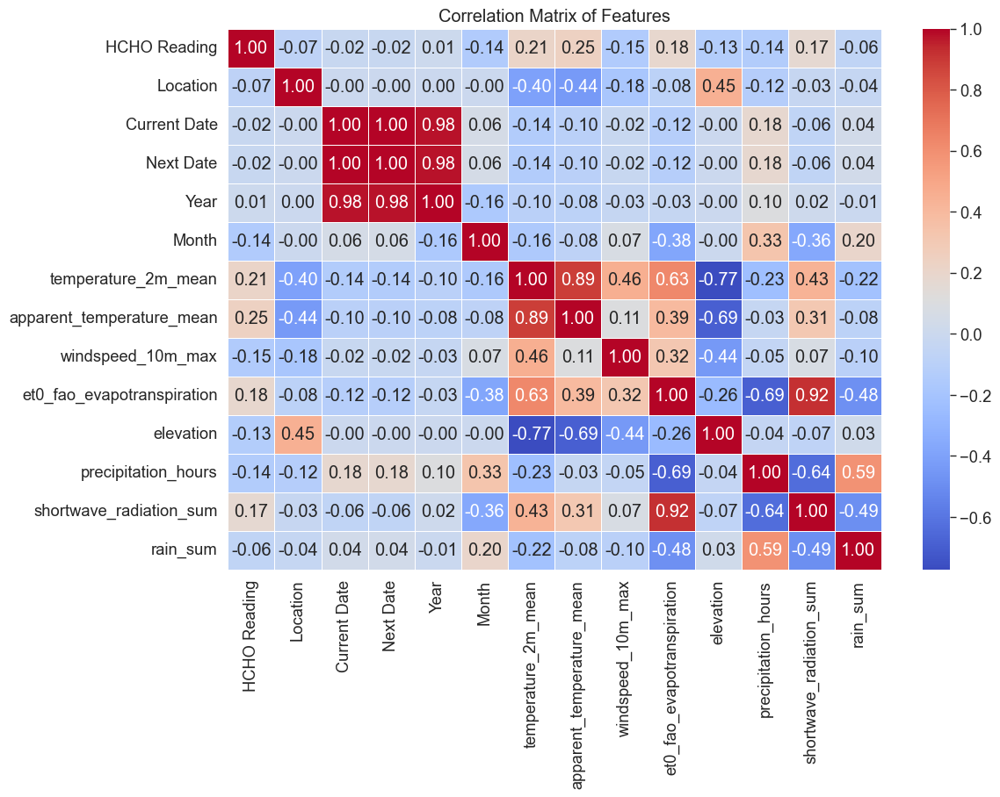

HCHO Reading                  1.000000
apparent_temperature_mean     0.245230
temperature_2m_mean           0.212435
et0_fao_evapotranspiration    0.183353
shortwave_radiation_sum       0.172479
Year                          0.009979
Current Date                 -0.022101
Next Date                    -0.022101
rain_sum                     -0.060428
Location                     -0.074876
elevation                    -0.130847
precipitation_hours          -0.135536
Month                        -0.144120
windspeed_10m_max            -0.147217
Name: HCHO Reading, dtype: float64

In [556]:
# Calculate correlation matrix
correlation_matrix = corr_df.corr()

# Plotting the correlation matrix with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title("Correlation Matrix of Features")
plt.show()

# Focus on the correlation of features with HCHO Reading specifically
correlation_hcho = correlation_matrix["HCHO Reading"].sort_values(ascending=False)
correlation_hcho


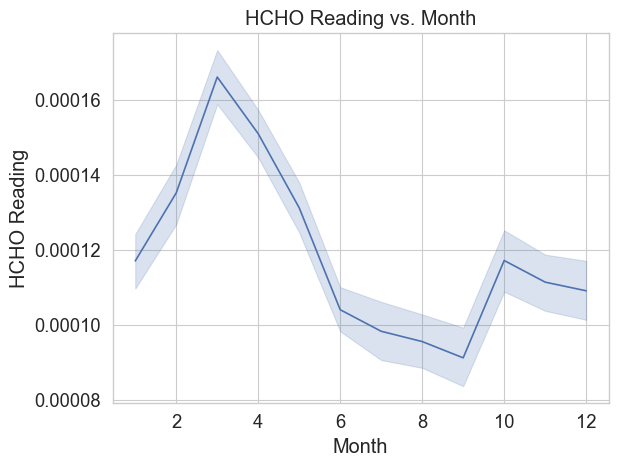

In [557]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lineplot(data=merged_df, x='Month', y='HCHO Reading')
plt.xlabel('Month')
plt.ylabel('HCHO Reading')
plt.title('HCHO Reading vs. Month')
plt.show()


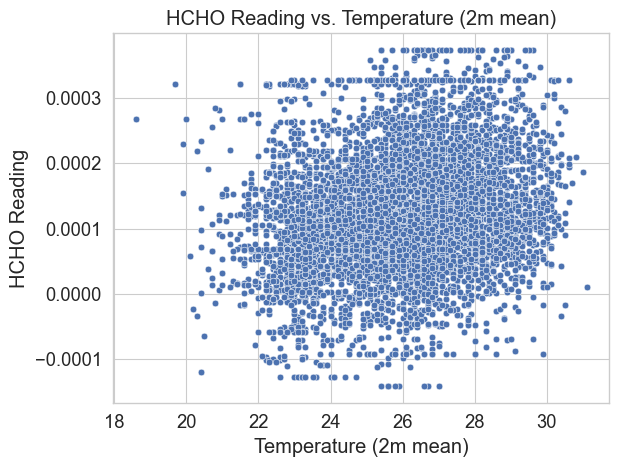

In [558]:
sns.scatterplot(data=merged_df, x='temperature_2m_mean', y='HCHO Reading')
plt.xlabel('Temperature (2m mean)')
plt.ylabel('HCHO Reading')
plt.title('HCHO Reading vs. Temperature (2m mean)')
plt.show()

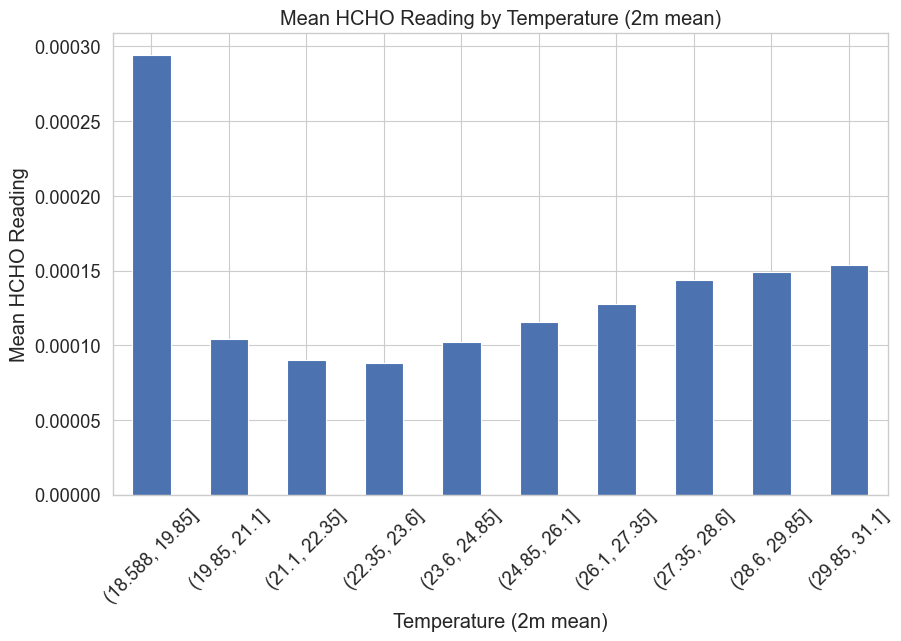

In [559]:
import seaborn as sns
import matplotlib.pyplot as plt

# Bin the temperature values into categories and calculate the mean HCHO Reading for each category
merged_df['temperature_bins'] = pd.cut(merged_df['temperature_2m_mean'], bins=10)  
mean_hcho_by_temp = merged_df.groupby('temperature_bins')['HCHO Reading'].mean()

# Plot a bar chart
plt.figure(figsize=(10, 6))
mean_hcho_by_temp.plot(kind='bar')
plt.xlabel('Temperature (2m mean)')
plt.ylabel('Mean HCHO Reading')
plt.title('Mean HCHO Reading by Temperature (2m mean)')
plt.xticks(rotation=45)
plt.show()


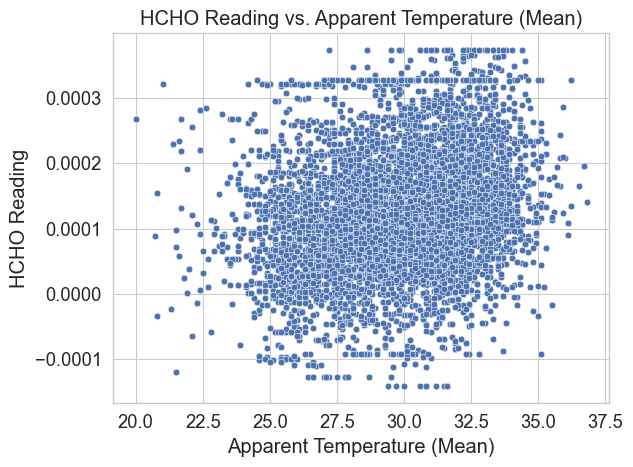

In [560]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'apparent_temperature_mean' is a column in merged_df
sns.scatterplot(data=merged_df, x='apparent_temperature_mean', y='HCHO Reading')
plt.xlabel('Apparent Temperature (Mean)')
plt.ylabel('HCHO Reading')
plt.title('HCHO Reading vs. Apparent Temperature (Mean)')
plt.show()


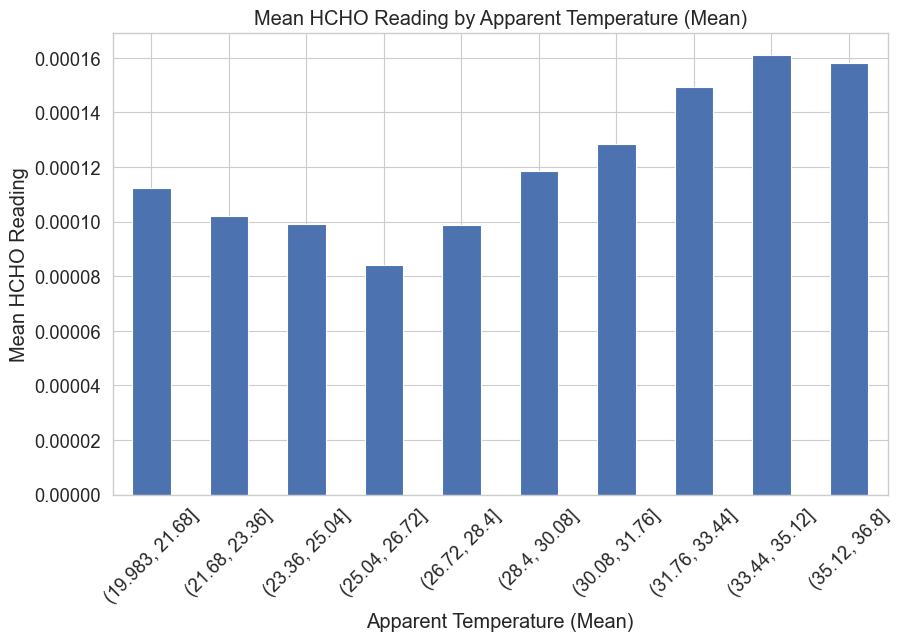

In [561]:
# Bin the apparent temperature values into categories and calculate the mean HCHO Reading for each category
merged_df['apparent_temperature_bins'] = pd.cut(merged_df['apparent_temperature_mean'], bins=10)  # Adjust number of bins as needed
mean_hcho_by_apparent_temp = merged_df.groupby('apparent_temperature_bins')['HCHO Reading'].mean()

# Plot a bar chart
plt.figure(figsize=(10, 6))
mean_hcho_by_apparent_temp.plot(kind='bar')
plt.xlabel('Apparent Temperature (Mean)')
plt.ylabel('Mean HCHO Reading')
plt.title('Mean HCHO Reading by Apparent Temperature (Mean)')
plt.xticks(rotation=45)
plt.show()

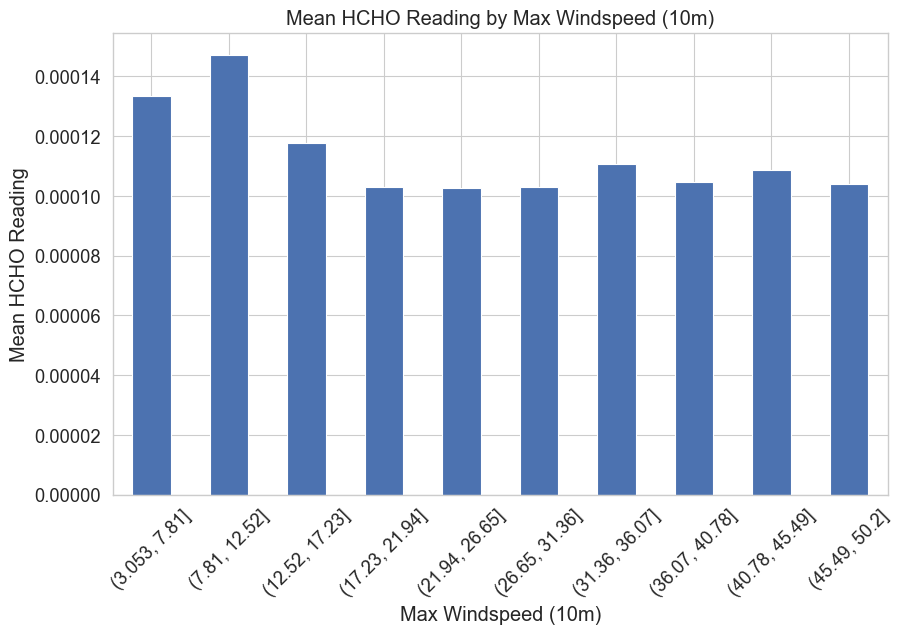

In [562]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Bin the windspeed_10m_max values into categories and calculate the mean HCHO Reading for each category
merged_df['windspeed_10m_max_bins'] = pd.cut(merged_df['windspeed_10m_max'], bins=10)  # Adjust number of bins as needed
mean_hcho_by_windspeed = merged_df.groupby('windspeed_10m_max_bins')['HCHO Reading'].mean()

# Plot a bar chart
plt.figure(figsize=(10, 6))
mean_hcho_by_windspeed.plot(kind='bar')
plt.xlabel('Max Windspeed (10m)')
plt.ylabel('Mean HCHO Reading')
plt.title('Mean HCHO Reading by Max Windspeed (10m)')
plt.xticks(rotation=45)
plt.show()


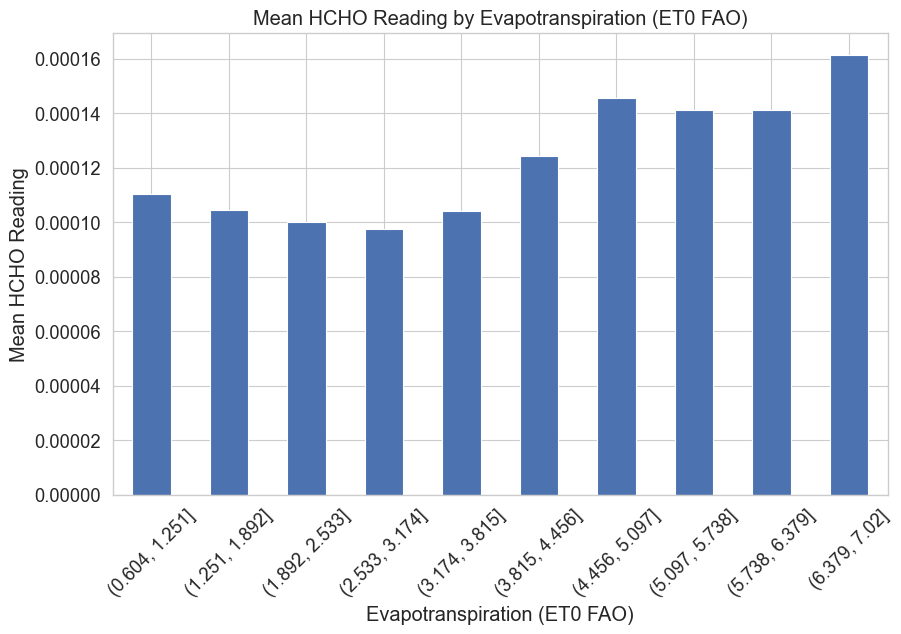

In [563]:
# Bin the et0_fao_evapotranspiration values into categories and calculate the mean HCHO Reading for each category
merged_df['et0_fao_evapotranspiration_bins'] = pd.cut(merged_df['et0_fao_evapotranspiration'], bins=10)  # Adjust number of bins as needed
mean_hcho_by_et0 = merged_df.groupby('et0_fao_evapotranspiration_bins')['HCHO Reading'].mean()

# Plot a bar chart
plt.figure(figsize=(10, 6))
mean_hcho_by_et0.plot(kind='bar')
plt.xlabel('Evapotranspiration (ET0 FAO)')
plt.ylabel('Mean HCHO Reading')
plt.title('Mean HCHO Reading by Evapotranspiration (ET0 FAO)')
plt.xticks(rotation=45)
plt.show()

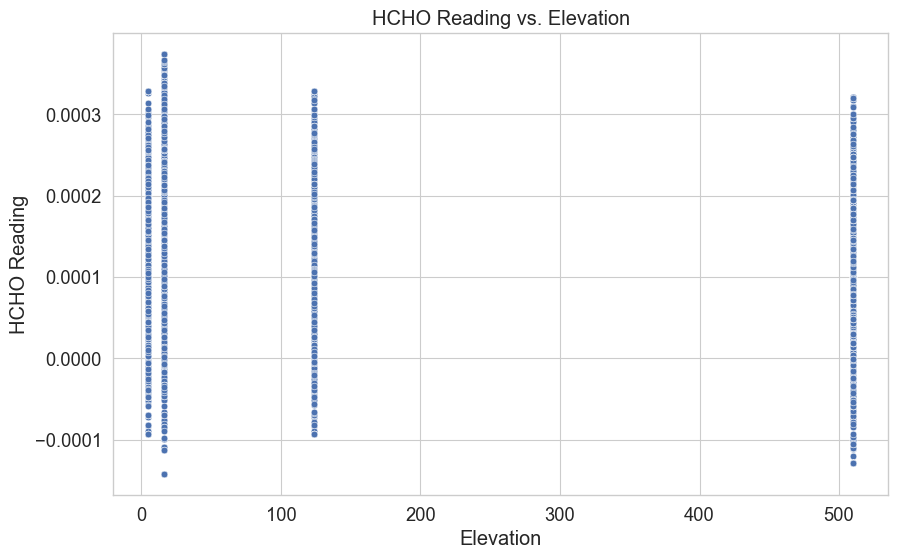

In [564]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=merged_df, x='elevation', y='HCHO Reading')
plt.xlabel('Elevation')
plt.ylabel('HCHO Reading')
plt.title('HCHO Reading vs. Elevation')
plt.show()

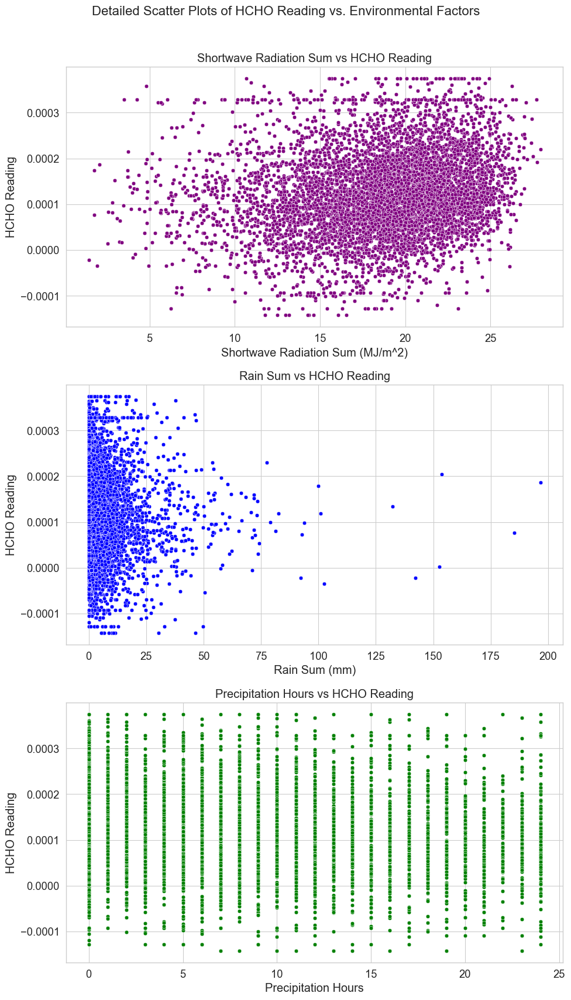

In [565]:
# Setting up the figure for scatter plots focusing on specified features
fig, axs = plt.subplots(3, 1, figsize=(10, 18))
fig.suptitle('Detailed Scatter Plots of HCHO Reading vs. Environmental Factors', fontsize=16)

# Shortwave Radiation Sum vs HCHO Reading
sns.scatterplot(ax=axs[0], data=merged_df, x='shortwave_radiation_sum', y='HCHO Reading', color='purple')
axs[0].set_title('Shortwave Radiation Sum vs HCHO Reading')
axs[0].set_xlabel('Shortwave Radiation Sum (MJ/m^2)')
axs[0].set_ylabel('HCHO Reading')

# Rain Sum vs HCHO Reading
sns.scatterplot(ax=axs[1], data=merged_df, x='rain_sum', y='HCHO Reading', color='blue')
axs[1].set_title('Rain Sum vs HCHO Reading')
axs[1].set_xlabel('Rain Sum (mm)')
axs[1].set_ylabel('HCHO Reading')

# Precipitation Hours vs HCHO Reading
sns.scatterplot(ax=axs[2], data=merged_df, x='precipitation_hours', y='HCHO Reading', color='green')
axs[2].set_title('Precipitation Hours vs HCHO Reading')
axs[2].set_xlabel('Precipitation Hours')
axs[2].set_ylabel('HCHO Reading')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


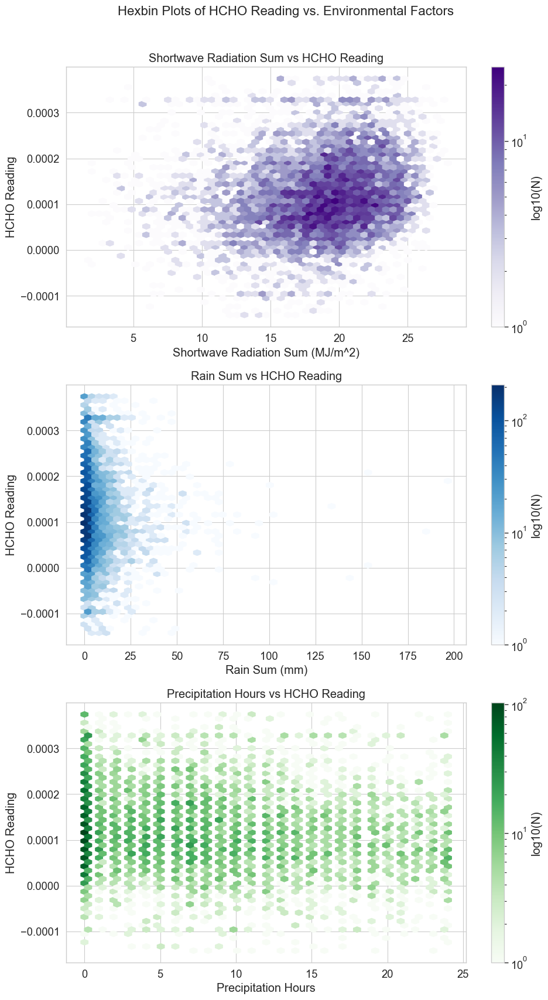

In [566]:
# Setting up the figure for hexbin plots
fig, axs = plt.subplots(3, 1, figsize=(10, 18))
fig.suptitle('Hexbin Plots of HCHO Reading vs. Environmental Factors', fontsize=16)

# Shortwave Radiation Sum vs HCHO Reading
hx0 = axs[0].hexbin(merged_df['shortwave_radiation_sum'], merged_df['HCHO Reading'], gridsize=50, cmap='Purples', bins='log')
fig.colorbar(hx0, ax=axs[0], label='log10(N)')
axs[0].set_title('Shortwave Radiation Sum vs HCHO Reading')
axs[0].set_xlabel('Shortwave Radiation Sum (MJ/m^2)')
axs[0].set_ylabel('HCHO Reading')

# Rain Sum vs HCHO Reading
hx1 = axs[1].hexbin(merged_df['rain_sum'], merged_df['HCHO Reading'], gridsize=50, cmap='Blues', bins='log')
fig.colorbar(hx1, ax=axs[1], label='log10(N)')
axs[1].set_title('Rain Sum vs HCHO Reading')
axs[1].set_xlabel('Rain Sum (mm)')
axs[1].set_ylabel('HCHO Reading')

# Precipitation Hours vs HCHO Reading
hx2 = axs[2].hexbin(merged_df['precipitation_hours'], merged_df['HCHO Reading'], gridsize=50, cmap='Greens', bins='log')
fig.colorbar(hx2, ax=axs[2], label='log10(N)')
axs[2].set_title('Precipitation Hours vs HCHO Reading')
axs[2].set_xlabel('Precipitation Hours')
axs[2].set_ylabel('HCHO Reading')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


In [567]:
concatenated_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02,2019,1,2019-01
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02,2019,1,2019-01
3,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03,2019,1,2019-01
...,...,...,...,...,...,...,...
12777,0.000158,Kurunegala,2023-12-30,2023-12-31,2023,12,2023-12
12778,0.000117,Jaffna,2023-12-30,2023-12-31,2023,12,2023-12
12779,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01,2023,12,2023-12
12780,0.000065,Kurunegala,2023-12-31,2024-01-01,2023,12,2023-12


In [568]:
concatenated_df

,HCHO Reading,Location,Current Date,Next Date,Year,Month,Month-Year
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,2019-01
1,0.000197,"Deniyaya, Matara",2019-01-01,2019-01-02,2019,1,2019-01
2,0.000263,Nuwara Eliya,2019-01-01,2019-01-02,2019,1,2019-01
3,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,2019-01
4,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03,2019,1,2019-01
...,...,...,...,...,...,...,...
12777,0.000158,Kurunegala,2023-12-30,2023-12-31,2023,12,2023-12
12778,0.000117,Jaffna,2023-12-30,2023-12-31,2023,12,2023-12
12779,0.000117,"Bibile, Monaragala",2023-12-31,2024-01-01,2023,12,2023-12
12780,0.000065,Kurunegala,2023-12-31,2024-01-01,2023,12,2023-12


In [569]:
from statsmodels.tsa.stattools import adfuller

# Augmented Dickey-Fuller test
adf_test = adfuller(concatenated_df['HCHO Reading'])

print('ADF Statistic: %f' % adf_test[0])
print('p-value: %f' % adf_test[1])
print('Critical Values:')
for key, value in adf_test[4].items():
    print('\t%s: %.3f' % (key, value))

# on p-value, decide on stationarity
if adf_test[1] > 0.05:
    print("The series is non-stationary.")
else:
    print("The series is stationary.")
    

ADF Statistic: -11.898220
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
The series is stationary.


In [570]:
# Convert 'Current Date' to datetime and set as index
concatenated_df['Current Date'] = pd.to_datetime(concatenated_df['Current Date'])
concatenated_df.set_index('Current Date', inplace=True)

# Output the first few rows and the index to verify changes
df_head_after = concatenated_df.head()
df_index_info = concatenated_df.index

df_head_after, df_index_info

(              HCHO Reading          Location  Next Date  Year  Month  \
 Current Date                                                           
 2019-01-01        0.000197           Colombo 2019-01-02  2019      1   
 2019-01-01        0.000197  Deniyaya, Matara 2019-01-02  2019      1   
 2019-01-01        0.000263      Nuwara Eliya 2019-01-02  2019      1   
 2019-01-02        0.000263           Colombo 2019-01-03  2019      1   
 2019-01-02        0.000006  Deniyaya, Matara 2019-01-03  2019      1   
 
              Month-Year  
 Current Date             
 2019-01-01      2019-01  
 2019-01-01      2019-01  
 2019-01-01      2019-01  
 2019-01-02      2019-01  
 2019-01-02      2019-01  ,
 DatetimeIndex(['2019-01-01', '2019-01-01', '2019-01-01', '2019-01-02',
                '2019-01-02', '2019-01-02', '2019-01-03', '2019-01-03',
                '2019-01-03', '2019-01-04',
                ...
                '2023-12-28', '2023-12-29', '2023-12-29', '2023-12-29',
                '

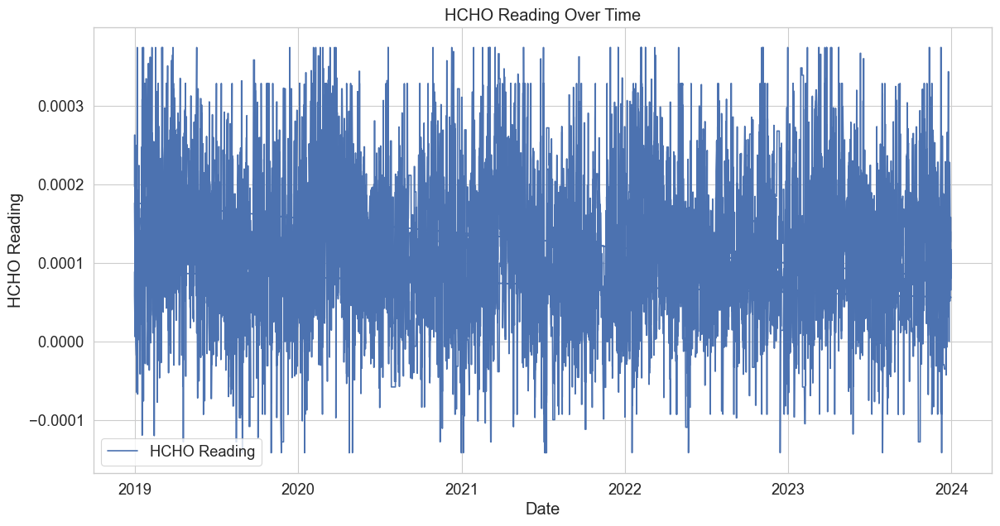

In [571]:
import matplotlib.pyplot as plt

# Plotting the HCHO Reading across time
plt.figure(figsize=(14, 7))
plt.plot(concatenated_df['HCHO Reading'], label='HCHO Reading')
plt.title('HCHO Reading Over Time')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.legend()
plt.show()

In [572]:
# Summary statistics by location
location_stats = concatenated_df.groupby('Location')['HCHO Reading'].describe()

print(location_stats)

                     count      mean       std       min       25%       50%  \
Location                                                                       
Bibile, Monaragala  1826.0  0.000120  0.000086 -0.000093  0.000063  0.000112   
Colombo             1826.0  0.000143  0.000100 -0.000142  0.000073  0.000137   
Deniyaya, Matara    1826.0  0.000112  0.000095 -0.000142  0.000048  0.000104   
Jaffna              1826.0  0.000110  0.000076 -0.000093  0.000062  0.000102   
Kandy               1826.0  0.000098  0.000088 -0.000128  0.000040  0.000099   
Kurunegala          1826.0  0.000126  0.000085 -0.000093  0.000069  0.000118   
Nuwara Eliya        1826.0  0.000104  0.000094 -0.000142  0.000041  0.000098   

                         75%       max  
Location                                
Bibile, Monaragala  0.000177  0.000328  
Colombo             0.000208  0.000374  
Deniyaya, Matara    0.000169  0.000374  
Jaffna              0.000154  0.000328  
Kandy               0.000153  0.0

In [573]:
from statsmodels.tsa.stattools import adfuller

# Running ADF test on the 'HCHO Reading' of one of the locations (e.g., Colombo)
result = adfuller(concatenated_df[concatenated_df['Location'] == 'Colombo']['HCHO Reading'])
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')


ADF Statistic: -4.643981930882586
p-value: 0.00010709010569373455


In [574]:
from statsmodels.tsa.stattools import adfuller

# Running ADF test on the 'HCHO Reading' of one of the locations (e.g., Colombo)
result = adfuller(concatenated_df[concatenated_df['Location'] == 'Bibile, Monaragala']['HCHO Reading'])
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')


ADF Statistic: -5.7532404619402735
p-value: 5.899756483936299e-07


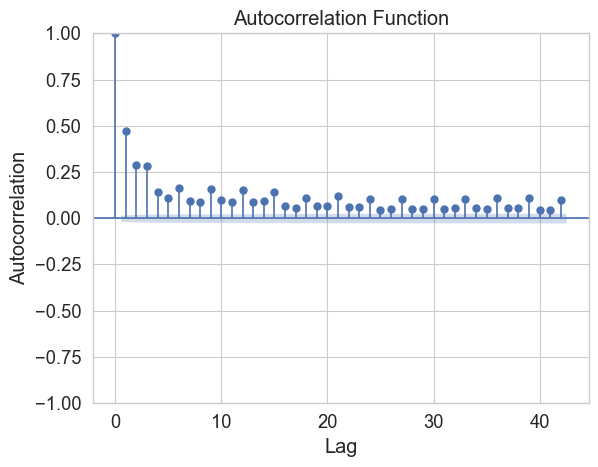

In [575]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation function
plot_acf(concatenated_df['HCHO Reading'])
plt.title('Autocorrelation Function')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()


# SARIMAX

# Model for colombo

In [576]:
# Selecting the data for the model 
colombo_data = concatenated_df[concatenated_df['Location'] == 'Colombo']['HCHO Reading']

In [577]:
colombo_data

Current Date
2019-01-01    0.000197
2019-01-02    0.000263
2019-01-03    0.000099
2019-01-04    0.000210
2019-01-05    0.000179
                ...   
2023-12-27    0.000118
2023-12-28    0.000228
2023-12-29    0.000140
2023-12-30    0.000140
2023-12-31    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [578]:
###################################

In [579]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Fit the SARIMA model
sarima_model = SARIMAX(colombo_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)

actual_data = colombo_data[-forecast_steps:]  # last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 9.395900610926002e-09
Mean Absolute Error (MAE): 7.666118869689663e-05


In [580]:
forecast

2024-01-01    0.000175
2024-01-02    0.000265
2024-01-03    0.000035
2024-01-04    0.000218
2024-01-05    0.000090
                ...   
2024-04-05    0.000110
2024-04-06    0.000131
2024-04-07    0.000213
2024-04-08    0.000055
2024-04-09    0.000196
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

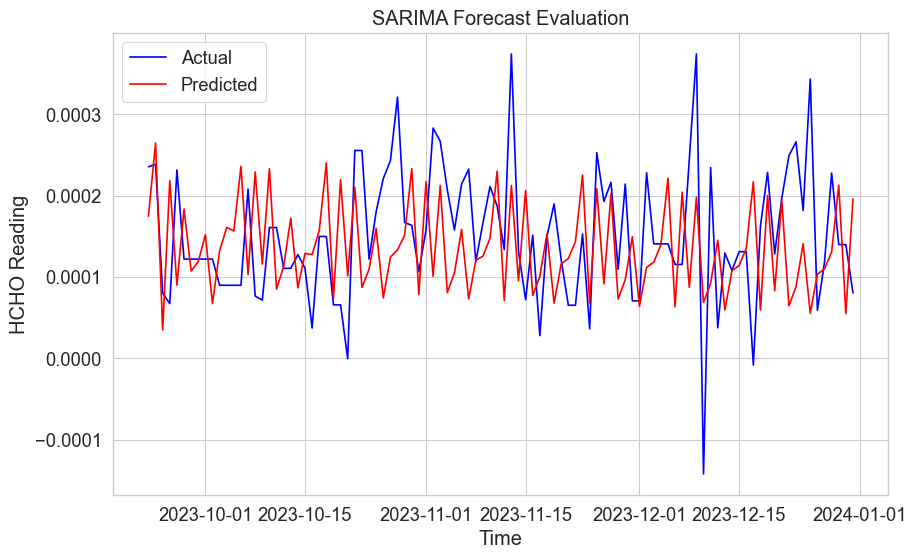

In [583]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()


In [586]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit


# Parameter Optimization
best_mse = float('inf')
best_order = None
best_seasonal_order = None

for p in range(3):  
    for d in range(3):  
        for q in range(3): 
            for sp in range(3):  
                for sd in range(3): 
                    for sq in range(3): 
                        order = (p, d, q)
                        seasonal_order = (sp, sd, sq, 12)  # this has yearly seasonality
                        try:
                            # Fit SARIMA model
                            sarima_model = SARIMAX(colombo_data, order=order, seasonal_order=seasonal_order)
                            sarima_result = sarima_model.fit()

                            # Forecast
                            forecast_steps = 100
                            forecast = sarima_result.forecast(steps=forecast_steps)

                            # Actual data
                            actual_data = colombo_data[-forecast_steps:]

                            # Calculate MSE
                            mse = mean_squared_error(actual_data, forecast)

                            # best parameters if MSE is lower
                            if mse < best_mse:
                                best_mse = mse
                                best_order = order
                                best_seasonal_order = seasonal_order

                        except:
                            continue

print("Best Model Parameters:")
print("Order:", best_order)
print("Seasonal Order:", best_seasonal_order)
print("Best Mean Squared Error (MSE):", best_mse)

# Cross-Validation
tscv = TimeSeriesSplit(n_splits=5)  # 5-fold time series cross-validation
mse_scores = []

for train_index, test_index in tscv.split(colombo_data):
    train_data = colombo_data[train_index]
    test_data = colombo_data[test_index]
    
    # Fit SARIMA model with best parameters
    sarima_model = SARIMAX(train_data, order=best_order, seasonal_order=best_seasonal_order)
    sarima_result = sarima_model.fit()
    
    # Forecast
    forecast_steps = len(test_index)
    forecast = sarima_result.forecast(steps=forecast_steps)
    
    # Calculate MSE
    mse = mean_squared_error(test_data, forecast)
    mse_scores.append(mse)

print("Cross-Validation Mean Squared Error (MSE):", sum(mse_scores) / len(mse_scores))


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency inform

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarni

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-in

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Like

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Like

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency informatio

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maxim

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency inform

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency inform

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Like

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Like

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequen

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency inform

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWa

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maxim

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: Use

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency inform

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maxim

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maxim

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequen

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Like

C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequen

Best Model Parameters:
Order: (0, 1, 2)
Seasonal Order: (0, 0, 0, 12)
Best Mean Squared Error (MSE): 6.871588359460293e-09


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, 

Cross-Validation Mean Squared Error (MSE): 1.0934317469437585e-08


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [592]:

from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error
import numpy as np

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mean_squared_error(actual_data, forecast_trimmed))


print("Root Mean Squared Error (RMSE):", rmse)



Root Mean Squared Error (RMSE): 8.46781648729583e-05


# Kandy

In [217]:
# Selecting the data for the model (using 'Colombo' location as example)
kandy_data = concatenated_df[concatenated_df['Location'] == 'Kandy']['HCHO Reading']
kandy_data

Current Date
2019-01-01    0.000176
2019-01-02    0.000092
2019-01-03    0.000092
2019-01-04    0.000191
2019-01-05    0.000122
                ...   
2023-12-27    0.000056
2023-12-28    0.000056
2023-12-29    0.000056
2023-12-30    0.000056
2023-12-31    0.000056
Name: HCHO Reading, Length: 1826, dtype: float64

In [218]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Fit the SARIMA model
sarima_model = SARIMAX(kandy_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)

actual_data = kandy_data[-forecast_steps:]  #  last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Mean Squared Error (MSE): 1.3257486149442746e-08
Mean Absolute Error (MAE): 9.163378888138991e-05


In [219]:
forecast

2024-01-01    0.000049
2024-01-02    0.000048
2024-01-03    0.000121
2024-01-04    0.000163
2024-01-05    0.000162
                ...   
2024-04-05    0.000089
2024-04-06    0.000105
2024-04-07    0.000105
2024-04-08    0.000151
2024-04-09    0.000204
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

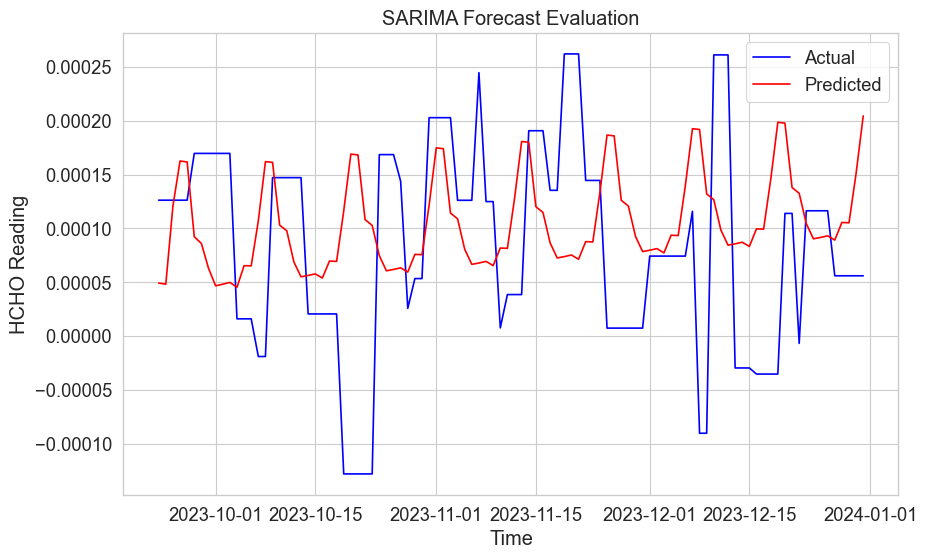

In [220]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()


# Kurunegala

In [221]:
# Selecting the data for the model (using 'Colombo' location as example)
kurunegala_data = concatenated_df[concatenated_df['Location'] == 'Kurunegala']['HCHO Reading']
kurunegala_data

Current Date
2019-01-01    0.000088
2019-01-02    0.000137
2019-01-03    0.000148
2019-01-04   -0.000002
2019-01-05    0.000249
                ...   
2023-12-27    0.000075
2023-12-28    0.000051
2023-12-29    0.000127
2023-12-30    0.000158
2023-12-31    0.000065
Name: HCHO Reading, Length: 1826, dtype: float64

In [222]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Fit the SARIMA model
sarima_model = SARIMAX(kurunegala_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)


actual_data = kurunegala_data[-forecast_steps:]  last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 1.1033577577266553e-08
Mean Absolute Error (MAE): 8.490463798038534e-05


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [223]:
forecast

2024-01-01    5.344466e-05
2024-01-02    8.038370e-05
2024-01-03    9.399151e-08
2024-01-04    1.289126e-04
2024-01-05    7.669012e-05
                  ...     
2024-04-05    8.377871e-05
2024-04-06   -8.879829e-06
2024-04-07    4.189647e-05
2024-04-08   -1.153885e-05
2024-04-09    6.748429e-05
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

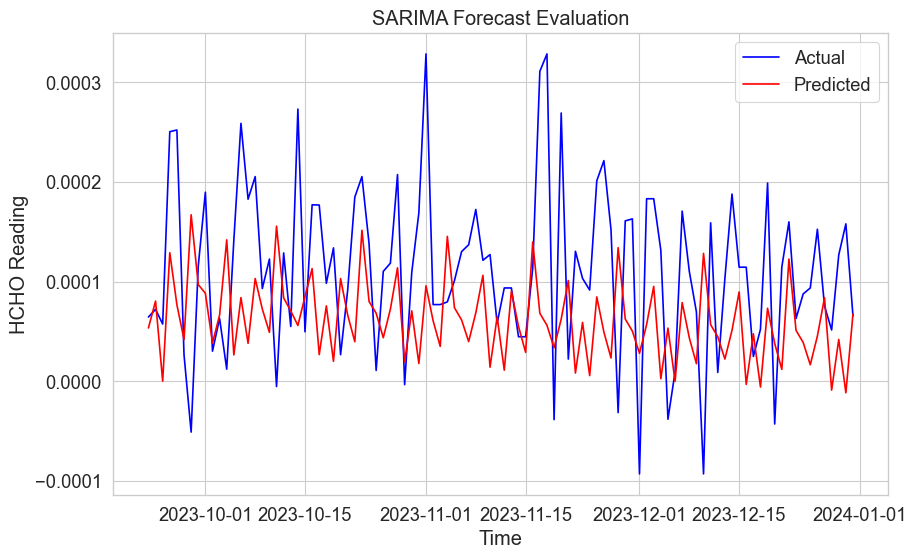

In [224]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()

# Matara Deniyaya

In [225]:
# Selecting the data for the model (using 'Colombo' location as example)
Matara_data = concatenated_df[concatenated_df['Location'] == 'Deniyaya, Matara']['HCHO Reading']
Matara_data

Current Date
2019-01-01    0.000197
2019-01-02    0.000006
2019-01-03    0.000236
2019-01-04    0.000064
2019-01-05    0.000053
                ...   
2023-12-27    0.000228
2023-12-28    0.000228
2023-12-29    0.000140
2023-12-30    0.000116
2023-12-31    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [226]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Fit the SARIMA model
sarima_model = SARIMAX(Matara_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)


actual_data = Matara_data[-forecast_steps:]  # last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 1.0091456763154504e-08
Mean Absolute Error (MAE): 7.629430840523009e-05


In [227]:
forecast

2024-01-01    0.000168
2024-01-02    0.000190
2024-01-03    0.000065
2024-01-04    0.000100
2024-01-05    0.000052
                ...   
2024-04-05    0.000083
2024-04-06    0.000163
2024-04-07    0.000154
2024-04-08    0.000108
2024-04-09    0.000091
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

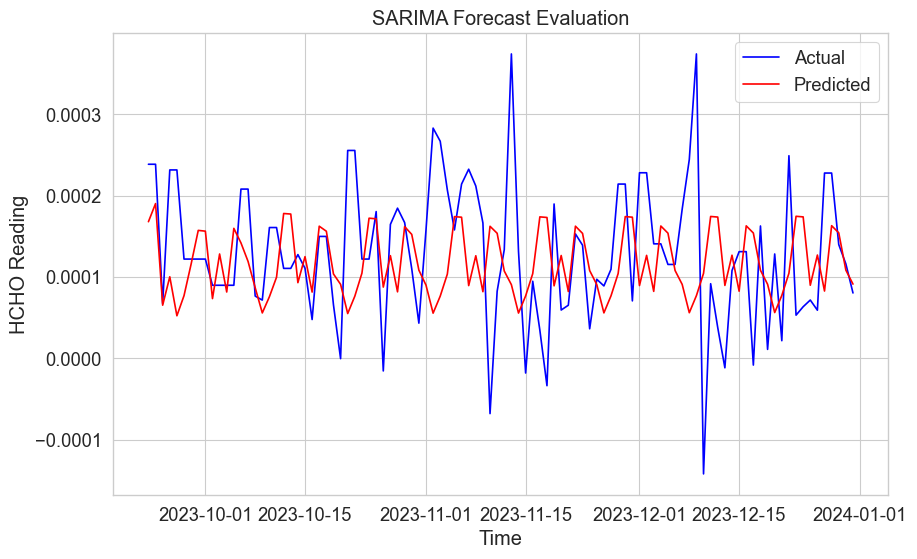

In [228]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()

# Jaffna

In [229]:
# Selecting the data for the model (using 'Colombo' location as example)
Jaffna_data = concatenated_df[concatenated_df['Location'] == 'Jaffna']['HCHO Reading']
Jaffna_data


Current Date
2019-01-01    0.000058
2019-01-02    0.000102
2019-01-03    0.000039
2019-01-04   -0.000002
2019-01-05    0.000159
                ...   
2023-12-27    0.000075
2023-12-28    0.000051
2023-12-29    0.000127
2023-12-30    0.000117
2023-12-31    0.000065
Name: HCHO Reading, Length: 1826, dtype: float64

In [230]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Fit the SARIMA model
sarima_model = SARIMAX(Jaffna_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)


actual_data = Jaffna_data[-forecast_steps:]  #  last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 6.823377486086506e-09
Mean Absolute Error (MAE): 6.451681673500704e-05


In [231]:
forecast

2024-01-01    0.000056
2024-01-02    0.000085
2024-01-03    0.000134
2024-01-04    0.000109
2024-01-05    0.000025
                ...   
2024-04-05    0.000073
2024-04-06    0.000012
2024-04-07    0.000062
2024-04-08    0.000110
2024-04-09    0.000068
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

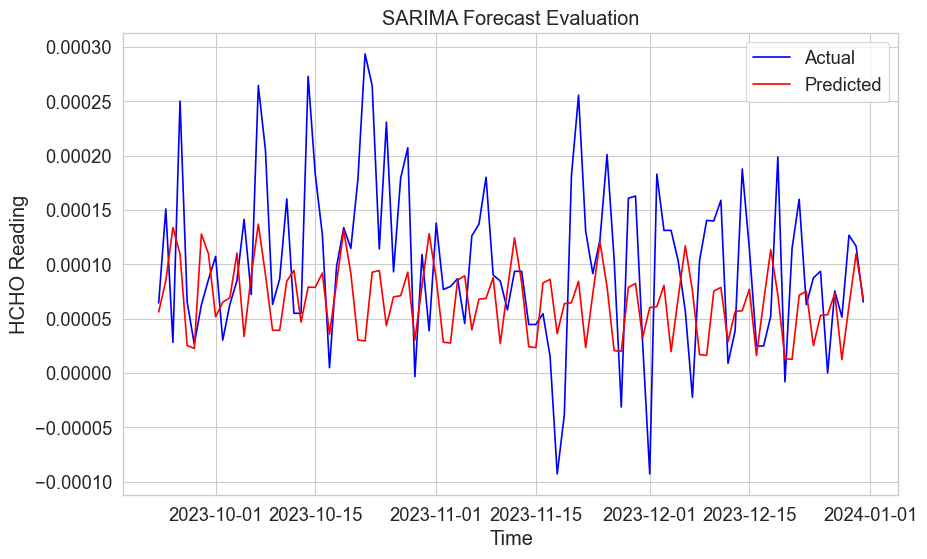

In [232]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()

# Monaragala / Bibile

In [233]:
# Selecting the data for the mode
Monaragala_data = concatenated_df[concatenated_df['Location'] == 'Bibile, Monaragala']['HCHO Reading']
Monaragala_data

Current Date
2019-01-01    8.829726e-05
2019-01-02    1.919915e-05
2019-01-03    2.811448e-05
2019-01-04    3.747998e-05
2019-01-05   -1.798261e-05
                  ...     
2023-12-27   -7.696313e-08
2023-12-28    7.547085e-05
2023-12-29    5.139770e-05
2023-12-30    1.267235e-04
2023-12-31    1.166590e-04
Name: HCHO Reading, Length: 1826, dtype: float64

In [234]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Fit the SARIMA model
sarima_model = SARIMAX(Monaragala_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)

actual_data = Monaragala_data[-forecast_steps:]  # last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 1.2197264022793589e-08
Mean Absolute Error (MAE): 9.01258030180024e-05


In [235]:
forecast

2024-01-01    0.000080
2024-01-02    0.000074
2024-01-03    0.000003
2024-01-04    0.000135
2024-01-05    0.000117
                ...   
2024-04-05    0.000079
2024-04-06    0.000002
2024-04-07    0.000006
2024-04-08   -0.000013
2024-04-09    0.000087
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

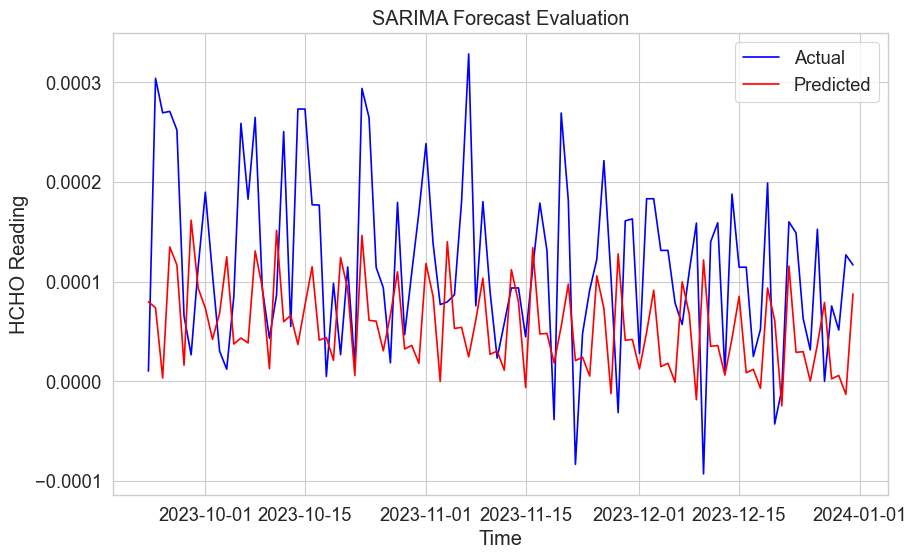

In [236]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()

# Nuwara Eliya

In [237]:
# Selecting the data for the model (using 'Colombo' location as example)
NuwaraEliya_data = concatenated_df[concatenated_df['Location'] == 'Nuwara Eliya']['HCHO Reading']
NuwaraEliya_data

Current Date
2019-01-01    0.000263
2019-01-02    0.000006
2019-01-03    0.000191
2019-01-04    0.000051
2019-01-05    0.000065
                ...   
2023-12-27    0.000228
2023-12-28    0.000228
2023-12-29    0.000140
2023-12-30    0.000116
2023-12-31    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [238]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Fit the SARIMA model
sarima_model = SARIMAX(NuwaraEliya_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()

# Forecast Evaluation
forecast_steps = 100
forecast = sarima_result.forecast(steps=forecast_steps)


actual_data = NuwaraEliya_data[-forecast_steps:]  #last 100 data points are the actual values for evaluation

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_data, forecast)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_data, forecast)

print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)


C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\MSI KATANA\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


Mean Squared Error (MSE): 1.0885372058915859e-08
Mean Absolute Error (MAE): 8.100563278195971e-05


In [239]:
forecast

2024-01-01    0.000221
2024-01-02    0.000192
2024-01-03    0.000069
2024-01-04    0.000128
2024-01-05    0.000088
                ...   
2024-04-05    0.000087
2024-04-06    0.000210
2024-04-07    0.000162
2024-04-08    0.000121
2024-04-09    0.000160
Freq: D, Name: predicted_mean, Length: 100, dtype: float64

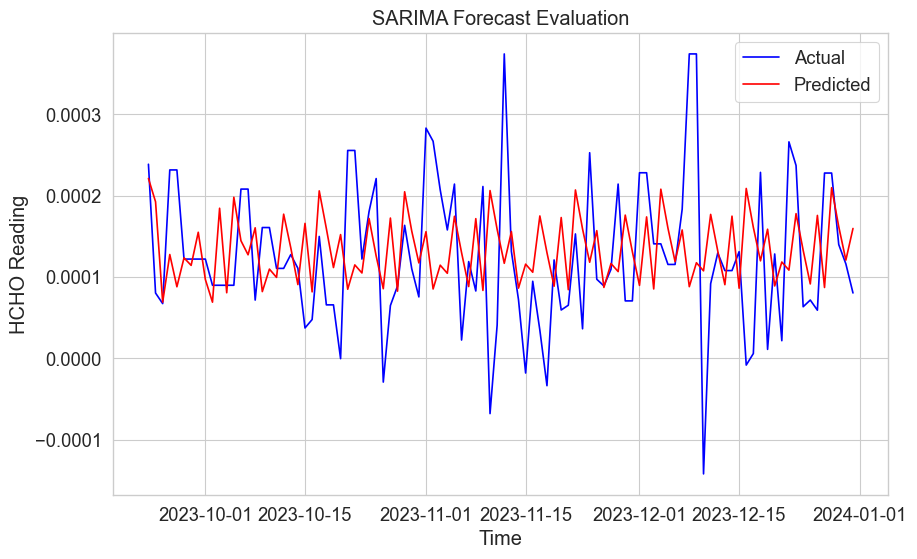

In [240]:
import matplotlib.pyplot as plt

# Plotting the predicted values and actual values
plt.figure(figsize=(10, 6))
plt.plot(actual_data.index, actual_data, label='Actual', color='blue')
plt.plot(actual_data.index, forecast, label='Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('HCHO Reading')
plt.title('SARIMA Forecast Evaluation')
plt.legend()
plt.show()

In [593]:
df_new = pd.read_csv('C:/Users/MSI KATANA/Desktop/practice ML/data engineering cw by inupa B/Data-Engineering-HCHO-gas-prediction-/new_df_advanced.csv')
df_new 

,HCHO Reading,Location,Current Date,Next Date,Year,Month,temperature_2m_mean,apparent_temperature_mean,windspeed_10m_max,et0_fao_evapotranspiration,elevation,precipitation_hours,shortwave_radiation_sum,rain_sum
0,0.000197,Colombo,2019-01-01,2019-01-02,2019,1,26.1,28.7,14.4,4.58,16.0,0.0,19.77,0.0
1,0.000263,Colombo,2019-01-02,2019-01-03,2019,1,25.7,27.3,16.6,5.19,16.0,0.0,21.45,0.0
2,0.000099,Colombo,2019-01-03,2019-01-04,2019,1,26.1,27.8,16.0,5.21,16.0,0.0,21.68,0.0
3,0.000210,Colombo,2019-01-04,2019-01-05,2019,1,26.0,27.6,16.9,5.22,16.0,0.0,22.95,0.0
4,0.000179,Colombo,2019-01-05,2019-01-06,2019,1,26.4,28.9,16.8,5.01,16.0,0.0,21.65,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6511,0.000214,Jaffna,2023-06-15,2023-06-16,2023,6,30.4,33.9,29.3,6.28,5.0,0.0,24.76,0.0
6512,0.000106,Kurunegala,2023-06-16,2023-06-17,2023,6,27.1,30.7,21.3,4.35,124.0,15.0,20.22,1.9
6513,0.000170,Jaffna,2023-06-16,2023-06-17,2023,6,30.7,34.8,30.8,6.12,5.0,0.0,23.96,0.0
6514,0.000306,Kurunegala,2023-06-17,2023-06-18,2023,6,26.4,29.8,20.0,3.42,124.0,19.0,14.99,5.5


# Applying second model

# Applying Third model

# By directional model

# Nuwara eliya

In [596]:
concatenated_df

,HCHO Reading,Location,Next Date,Year,Month,Month-Year
Current Date,,,,,,
2019-01-01,0.000197,Colombo,2019-01-02,2019,1,2019-01
2019-01-01,0.000197,"Deniyaya, Matara",2019-01-02,2019,1,2019-01
2019-01-01,0.000263,Nuwara Eliya,2019-01-02,2019,1,2019-01
2019-01-02,0.000263,Colombo,2019-01-03,2019,1,2019-01
2019-01-02,0.000006,"Deniyaya, Matara",2019-01-03,2019,1,2019-01
...,...,...,...,...,...,...
2023-12-30,0.000158,Kurunegala,2023-12-31,2023,12,2023-12
2023-12-30,0.000117,Jaffna,2023-12-31,2023,12,2023-12
2023-12-31,0.000117,"Bibile, Monaragala",2024-01-01,2023,12,2023-12


In [597]:
NE_df = concatenated_df[concatenated_df['Location'] == 'Nuwara Eliya']
df_X = NE_df.reset_index()['HCHO Reading']

In [598]:
df_X

0       0.000263
1       0.000006
2       0.000191
3       0.000051
4       0.000065
          ...   
1821    0.000228
1822    0.000228
1823    0.000140
1824    0.000116
1825    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [599]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_X = scaler.fit_transform(np.array(df_X).reshape(-1,1))                                         
training_size = int(len(df_X) * 0.70)
test_size = len(df_X) - training_size
train_data, test_data = df_X[0:training_size,:], df_X[training_size:len(df_X),:1]                                                                      
                                                                                                    
# convert an array of values into  matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)





Epoch 1/100

74/74 [==============================] - 8s 56ms/step - loss: 0.0422 - val_loss: 0.0318
Epoch 2/100
74/74 [==============================] - 4s 47ms/step - loss: 0.0339 - val_loss: 0.0329
Epoch 3/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0349 - val_loss: 0.0317
Epoch 4/100
74/74 [==============================] - 4s 54ms/step - loss: 0.0341 - val_loss: 0.0318
Epoch 5/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0339 - val_loss: 0.0314
Epoch 6/100
74/74 [==============================] - 4s 52ms/step - loss: 0.0348 - val_loss: 0.0313
Epoch 7/100
74/74 [==============================] - 4s 50ms/step - loss: 0.0338 - val_loss: 0.0325
Epoch 8/100
74/74 [==============================] - 4s 54ms/step - loss: 0.0333 - val_loss: 0.0324
Epoch 9/100
74/74 [==============================] - 4s 52ms/step - loss: 0.0337 - val_loss: 0.0318
Epoch 10/100
74/74 [==============================] - 4s 52ms/step - loss: 0.0333 - val_loss: 0.

Epoch 74/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0320 - val_loss: 0.0312
Epoch 75/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0321 - val_loss: 0.0302
Epoch 76/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0319 - val_loss: 0.0306
Epoch 77/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0319 - val_loss: 0.0304
Epoch 78/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0320 - val_loss: 0.0302
Epoch 79/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0318 - val_loss: 0.0302
Epoch 80/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0318 - val_loss: 0.0309
Epoch 81/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0320 - val_loss: 0.0305
Epoch 82/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0318 - val_loss: 0.0303
Epoch 83/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0319 - val_los

In [600]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)#  back to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [602]:
import pandas as pd

# Inverse transform the original test data 
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

#  DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000061,0.000106
1,0.000061,0.000075
2,0.000061,0.000095
3,-0.000033,0.000079
4,-0.000033,0.000070
5,-0.000033,0.000059
6,-0.000033,0.000053
7,0.000137,0.000049
8,0.000137,0.000094
9,0.000035,0.000096


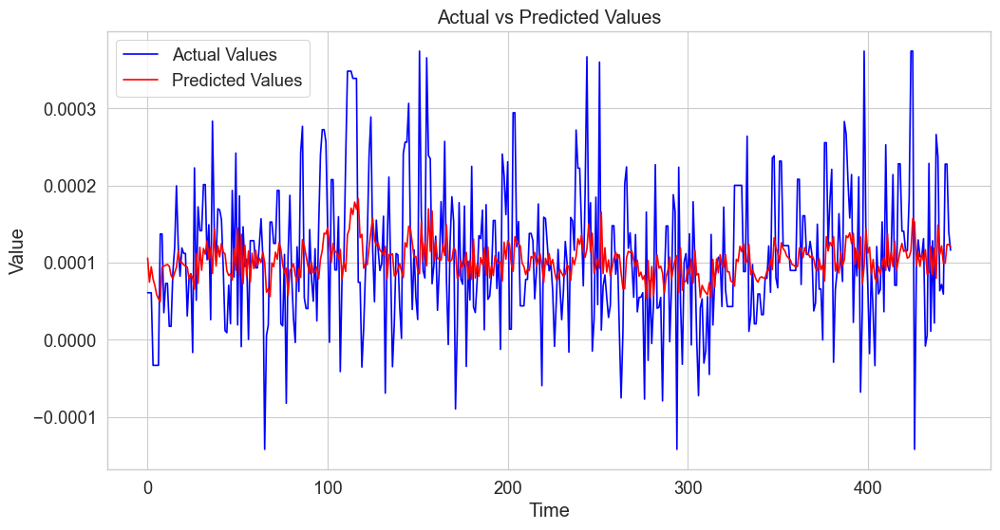

In [603]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


In [604]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)


Mean Absolute Error: 6.92938357422394e-05
Mean Squared Error: 8.1141901530285e-09
Root Mean Squared Error: 9.007879968687693e-05


# Colombo

In [605]:
CMB_df = concatenated_df[concatenated_df['Location'] == 'Colombo']
df_CMB = CMB_df.reset_index()['HCHO Reading']
df_CMB

0       0.000197
1       0.000263
2       0.000099
3       0.000210
4       0.000179
          ...   
1821    0.000118
1822    0.000228
1823    0.000140
1824    0.000140
1825    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [606]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming time_step is the length of input sequences
time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_CMB = scaler.fit_transform(np.array(df_CMB).reshape(-1,1))                                         
training_size = int(len(df_CMB) * 0.70)
test_size = len(df_CMB) - training_size
train_data, test_data = df_CMB[0:training_size,:], df_CMB[training_size:len(df_CMB),:1]                                                                      
                                                                                                    
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)


Epoch 1/100
74/74 [==============================] - 9s 64ms/step - loss: 0.0494 - val_loss: 0.0289
Epoch 2/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0333 - val_loss: 0.0286
Epoch 3/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0338 - val_loss: 0.0293
Epoch 4/100
74/74 [==============================] - 4s 50ms/step - loss: 0.0329 - val_loss: 0.0322
Epoch 5/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0325 - val_loss: 0.0284
Epoch 6/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0331 - val_loss: 0.0283
Epoch 7/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0327 - val_loss: 0.0287
Epoch 8/100
74/74 [==============================] - 4s 47ms/step - loss: 0.0335 - val_loss: 0.0281
Epoch 9/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0336 - val_loss: 0.0281
Epoch 10/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0322 - val_loss: 0.0326

74/74 [==============================] - 4s 49ms/step - loss: 0.0286 - val_loss: 0.0271
Epoch 83/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0287 - val_loss: 0.0269
Epoch 84/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0288 - val_loss: 0.0270
Epoch 85/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0288 - val_loss: 0.0267
Epoch 86/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0286 - val_loss: 0.0267
Epoch 87/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0284 - val_loss: 0.0287
Epoch 88/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0282 - val_loss: 0.0280
Epoch 89/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0282 - val_loss: 0.0267
Epoch 90/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0282 - val_loss: 0.0270
Epoch 91/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0283 - val_loss: 0.0269
Epo

In [607]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [608]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000142,0.000047
1,0.000061,0.000123
2,0.000061,0.000063
3,0.000061,0.000088
4,-0.000033,0.000071
5,-0.000033,0.000036
6,-0.000033,0.000041
7,-0.000033,0.000026
8,0.000137,0.000031
9,0.000137,0.000119


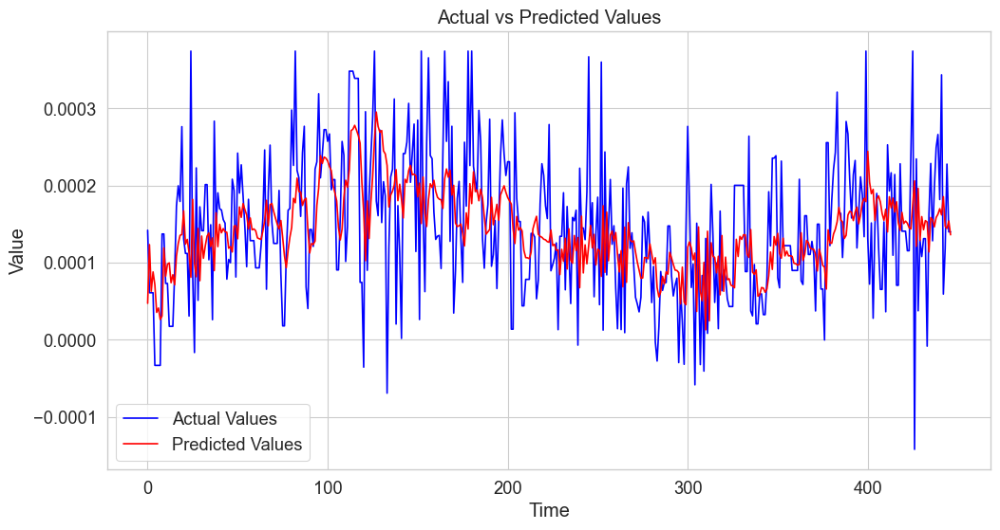

In [609]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [610]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 6.626738209092224e-05
Mean Squared Error: 7.320485467537524e-09
Root Mean Squared Error: 8.555983559788742e-05


# Jaffna

In [611]:
JAFNA_df = concatenated_df[concatenated_df['Location'] == 'Jaffna']
df_JAFNA = JAFNA_df.reset_index()['HCHO Reading']
df_JAFNA 

0       0.000058
1       0.000102
2       0.000039
3      -0.000002
4       0.000159
          ...   
1821    0.000075
1822    0.000051
1823    0.000127
1824    0.000117
1825    0.000065
Name: HCHO Reading, Length: 1826, dtype: float64

In [612]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming time_step is the length of input sequences
time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_JAFNA = scaler.fit_transform(np.array(df_JAFNA).reshape(-1,1))                                         
training_size = int(len(df_JAFNA) * 0.70)
test_size = len(df_JAFNA) - training_size
train_data, test_data = df_JAFNA[0:training_size,:], df_JAFNA[training_size:len(df_JAFNA),:1]                                                                      
                                                                                                    
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)


Epoch 1/100
74/74 [==============================] - 8s 57ms/step - loss: 0.0449 - val_loss: 0.0314
Epoch 2/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0330 - val_loss: 0.0309
Epoch 3/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0330 - val_loss: 0.0310
Epoch 4/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0326 - val_loss: 0.0308
Epoch 5/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0325 - val_loss: 0.0317
Epoch 6/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0330 - val_loss: 0.0324
Epoch 7/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0329 - val_loss: 0.0315
Epoch 8/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0322 - val_loss: 0.0330
Epoch 9/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0335 - val_loss: 0.0316
Epoch 10/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0326 - val_loss: 0.0309

74/74 [==============================] - 4s 48ms/step - loss: 0.0306 - val_loss: 0.0305
Epoch 83/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0307 - val_loss: 0.0308
Epoch 84/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0302 - val_loss: 0.0302
Epoch 85/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0305 - val_loss: 0.0302
Epoch 86/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0302 - val_loss: 0.0305
Epoch 87/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0310 - val_loss: 0.0298
Epoch 88/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0305 - val_loss: 0.0301
Epoch 89/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0302 - val_loss: 0.0313
Epoch 90/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0304 - val_loss: 0.0312
Epoch 91/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0302 - val_loss: 0.0301
Epo

In [613]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [614]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000111,0.000122
1,0.000131,0.000103
2,0.000057,0.000094
3,0.000134,0.000080
4,0.000282,0.000091
5,0.000052,0.000133
6,0.000068,0.000094
7,0.000068,0.000083
8,0.000103,0.000090
9,0.000129,0.000102


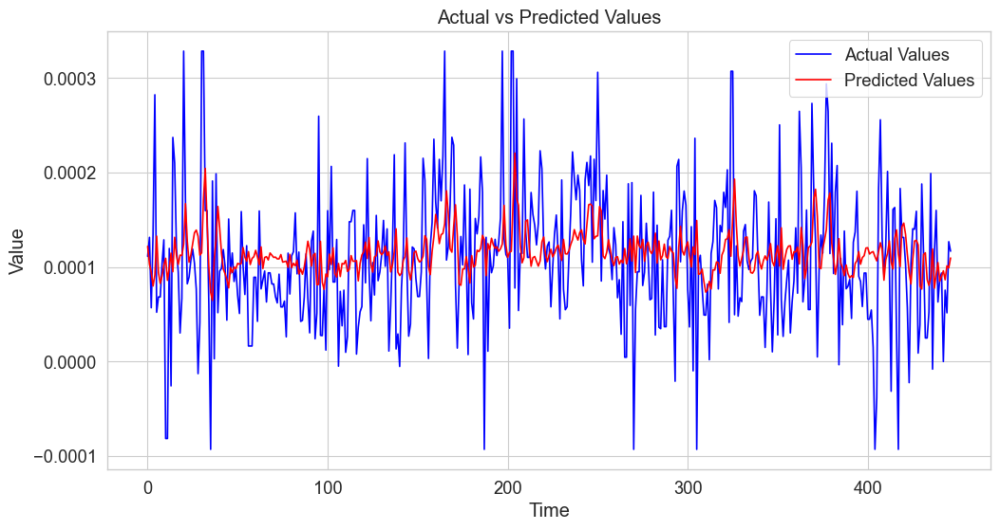

In [615]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [616]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 5.704091330986468e-05
Mean Squared Error: 5.406852782393639e-09
Root Mean Squared Error: 7.353130477826188e-05


# Deniyaya marata

In [617]:
MATARA_df = concatenated_df[concatenated_df['Location'] == 'Deniyaya, Matara']
df_MATARA = MATARA_df.reset_index()['HCHO Reading']
df_MATARA

0       0.000197
1       0.000006
2       0.000236
3       0.000064
4       0.000053
          ...   
1821    0.000228
1822    0.000228
1823    0.000140
1824    0.000116
1825    0.000080
Name: HCHO Reading, Length: 1826, dtype: float64

In [618]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming time_step is the length of input sequences
time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_MATARA = scaler.fit_transform(np.array(df_MATARA).reshape(-1,1))                                         
training_size = int(len(df_MATARA) * 0.70)
test_size = len(df_MATARA) - training_size
train_data, test_data = df_MATARA[0:training_size,:], df_MATARA[training_size:len(df_MATARA),:1]                                                                      
                                                                                                    
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)


Epoch 1/100
74/74 [==============================] - 8s 56ms/step - loss: 0.0450 - val_loss: 0.0366
Epoch 2/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0330 - val_loss: 0.0346
Epoch 3/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0332 - val_loss: 0.0353
Epoch 4/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0321 - val_loss: 0.0341
Epoch 5/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0322 - val_loss: 0.0341
Epoch 6/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0327 - val_loss: 0.0346
Epoch 7/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0325 - val_loss: 0.0348
Epoch 8/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0315 - val_loss: 0.0340
Epoch 9/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0314 - val_loss: 0.0346
Epoch 10/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0315 - val_loss: 0.0347

74/74 [==============================] - 3s 47ms/step - loss: 0.0301 - val_loss: 0.0327
Epoch 83/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0297 - val_loss: 0.0327
Epoch 84/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0298 - val_loss: 0.0335
Epoch 85/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0302 - val_loss: 0.0328
Epoch 86/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0299 - val_loss: 0.0327
Epoch 87/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0295 - val_loss: 0.0327
Epoch 88/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0303 - val_loss: 0.0330
Epoch 89/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0302 - val_loss: 0.0327
Epoch 90/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0299 - val_loss: 0.0327
Epoch 91/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0306 - val_loss: 0.0329
Epo

In [619]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [620]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000142,0.000105
1,0.000061,0.000106
2,0.000061,0.000097
3,0.000061,0.000094
4,-0.000033,0.000090
5,-0.000033,0.000070
6,-0.000033,0.000057
7,-0.000033,0.000044
8,0.000137,0.000035
9,0.000035,0.000069


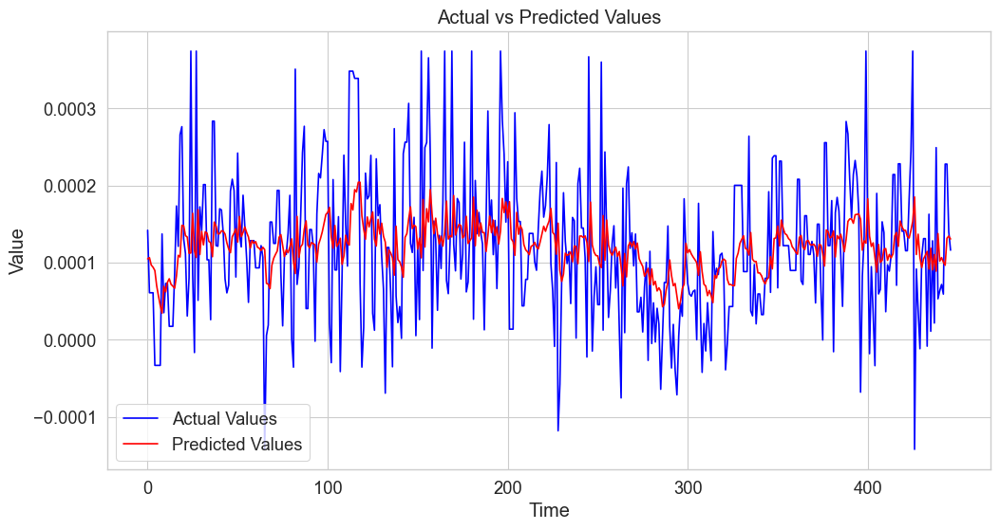

In [621]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [622]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 7.207027038133484e-05
Mean Squared Error: 8.701404829281404e-09
Root Mean Squared Error: 9.328132090231894e-05


# Kandy

In [623]:
KANDY_df = concatenated_df[concatenated_df['Location'] == 'Kandy']
df_KANDY = KANDY_df.reset_index()['HCHO Reading']
df_KANDY

0       0.000176
1       0.000092
2       0.000092
3       0.000191
4       0.000122
          ...   
1821    0.000056
1822    0.000056
1823    0.000056
1824    0.000056
1825    0.000056
Name: HCHO Reading, Length: 1826, dtype: float64

In [624]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming time_step is the length of input sequences
time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_KANDY = scaler.fit_transform(np.array(df_KANDY).reshape(-1,1))                                         
training_size = int(len(df_KANDY) * 0.70)
test_size = len(df_KANDY) - training_size
train_data, test_data = df_KANDY[0:training_size,:], df_KANDY[training_size:len(df_KANDY),:1]                                                                      
                                                                                                    
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)


Epoch 1/100
74/74 [==============================] - 8s 57ms/step - loss: 0.0518 - val_loss: 0.0365
Epoch 2/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0403 - val_loss: 0.0353
Epoch 3/100
74/74 [==============================] - 4s 47ms/step - loss: 0.0411 - val_loss: 0.0383
Epoch 4/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0396 - val_loss: 0.0349
Epoch 5/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0390 - val_loss: 0.0351
Epoch 6/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0376 - val_loss: 0.0309
Epoch 7/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0341 - val_loss: 0.0273
Epoch 8/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0314 - val_loss: 0.0252
Epoch 9/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0301 - val_loss: 0.0240
Epoch 10/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0285 - val_loss: 0.0255

74/74 [==============================] - 3s 46ms/step - loss: 0.0267 - val_loss: 0.0236
Epoch 83/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0266 - val_loss: 0.0242
Epoch 84/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0260 - val_loss: 0.0238
Epoch 85/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0263 - val_loss: 0.0243
Epoch 86/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0262 - val_loss: 0.0237
Epoch 87/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0261 - val_loss: 0.0241
Epoch 88/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0259 - val_loss: 0.0241
Epoch 89/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0257 - val_loss: 0.0238
Epoch 90/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0256 - val_loss: 0.0235
Epoch 91/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0255 - val_loss: 0.0237
Epo

In [625]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [626]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000264,0.000165
1,0.000264,0.000159
2,0.000264,0.000157
3,0.000153,0.000155
4,0.000153,0.000111
5,0.000153,0.000109
6,0.000153,0.000108
7,0.000153,0.000121
8,0.000153,0.000125
9,0.000153,0.000124


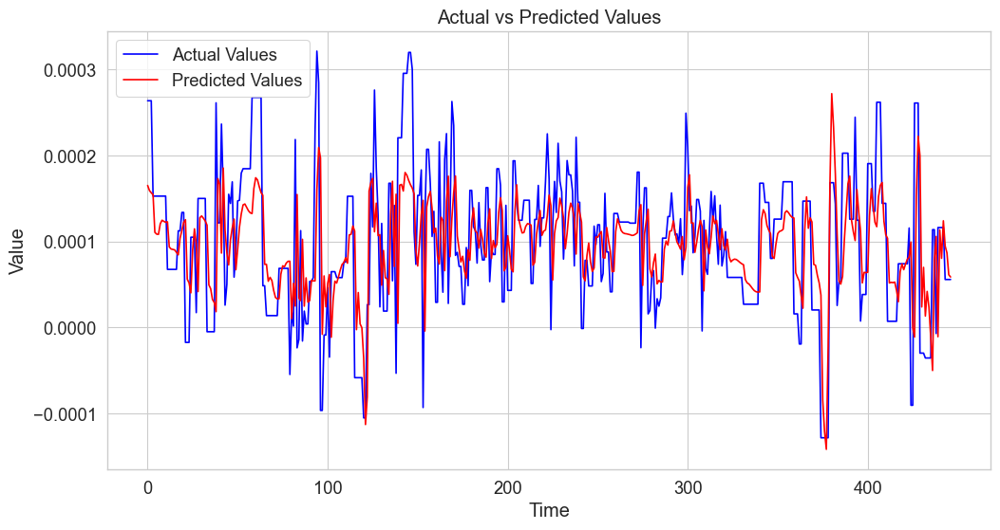

In [627]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [628]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 5.239600690429524e-05
Mean Squared Error: 5.0255708789964056e-09
Root Mean Squared Error: 7.089126094940338e-05


# Kurunegala

In [629]:
KURUNEGALA_df = concatenated_df[concatenated_df['Location'] == 'Kurunegala']
df_KURUNEGALA = KURUNEGALA_df.reset_index()['HCHO Reading']
df_KURUNEGALA

0       0.000088
1       0.000137
2       0.000148
3      -0.000002
4       0.000249
          ...   
1821    0.000075
1822    0.000051
1823    0.000127
1824    0.000158
1825    0.000065
Name: HCHO Reading, Length: 1826, dtype: float64

In [630]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Assuming time_step is the length of input sequences
time_step = 100

scaler = MinMaxScaler(feature_range=(0,1))
df_KURUNEGALA = scaler.fit_transform(np.array(df_KURUNEGALA).reshape(-1,1))                                         
training_size = int(len(df_KURUNEGALA) * 0.70)
test_size = len(df_KURUNEGALA) - training_size
train_data, test_data = df_KURUNEGALA[0:training_size,:], df_KURUNEGALA[training_size:len(df_KURUNEGALA),:1]                                                                      
                                                                                                    
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)                                                                                                            
                                                                                                          
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1) 

model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(time_step, 1)))
model.add(LSTM(50, return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, validation_data=(X_test, ytest), epochs=100, batch_size=16, verbose=1)


Epoch 1/100
74/74 [==============================] - 8s 57ms/step - loss: 0.0556 - val_loss: 0.0348
Epoch 2/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0400 - val_loss: 0.0363
Epoch 3/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0403 - val_loss: 0.0363
Epoch 4/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0404 - val_loss: 0.0369
Epoch 5/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0403 - val_loss: 0.0347
Epoch 6/100
74/74 [==============================] - 3s 45ms/step - loss: 0.0404 - val_loss: 0.0372
Epoch 7/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0405 - val_loss: 0.0347
Epoch 8/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0397 - val_loss: 0.0355
Epoch 9/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0403 - val_loss: 0.0347
Epoch 10/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0396 - val_loss: 0.0353

74/74 [==============================] - 3s 46ms/step - loss: 0.0374 - val_loss: 0.0360
Epoch 83/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0372 - val_loss: 0.0356
Epoch 84/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0371 - val_loss: 0.0361
Epoch 85/100
74/74 [==============================] - 4s 49ms/step - loss: 0.0372 - val_loss: 0.0364
Epoch 86/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0373 - val_loss: 0.0350
Epoch 87/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0370 - val_loss: 0.0351
Epoch 88/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0369 - val_loss: 0.0351
Epoch 89/100
74/74 [==============================] - 3s 47ms/step - loss: 0.0372 - val_loss: 0.0374
Epoch 90/100
74/74 [==============================] - 4s 48ms/step - loss: 0.0369 - val_loss: 0.0352
Epoch 91/100
74/74 [==============================] - 3s 46ms/step - loss: 0.0368 - val_loss: 0.0351
Epo

In [631]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 16ms/step


In [632]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000112,0.000136
1,0.000285,0.000122
2,0.000057,0.000149
3,0.000134,0.000091
4,0.000282,0.000126
5,0.000052,0.000167
6,0.000068,0.000097
7,0.000068,0.000129
8,0.000103,0.000125
9,0.000184,0.000126


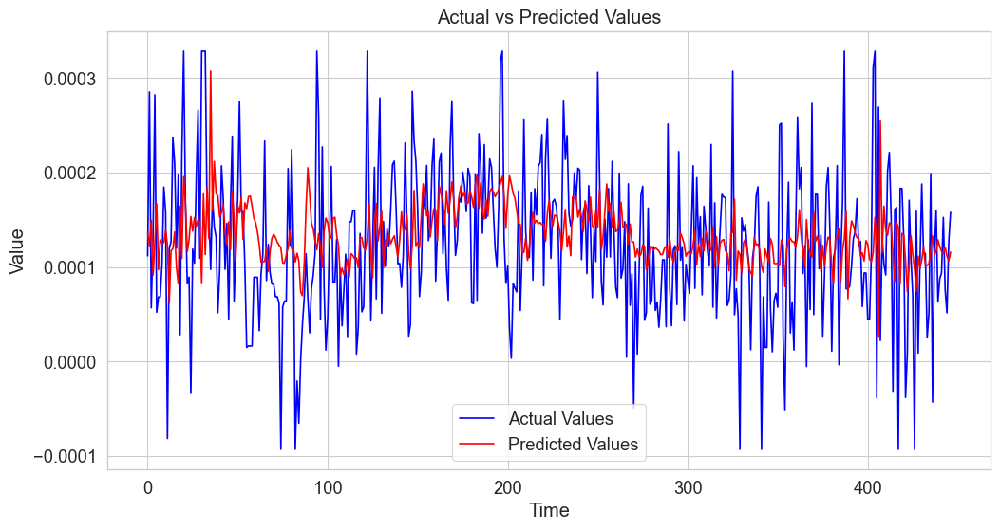

In [633]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values
plt.figure(figsize=(12, 6))
plt.plot(actual_values, label='Actual Values', color='blue')
plt.plot(test_predict.flatten(), label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [634]:
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(actual_values, test_predict)
print('Mean Absolute Error:', mae)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_values, test_predict)
print('Mean Squared Error:', mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, test_predict))
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 6.326277070868141e-05
Mean Squared Error: 6.63279967897477e-09
Root Mean Squared Error: 8.144200193373668e-05
